# NFL Sports Betting Capstone: Historical Data Scraper
_By Justin Tunley_

#### Table of Contents:
1. Introduction
2. Data Scraping
2. EDA and Preprocessing
3. Modeling
4. Model Evaluation

**DataSets:**
1. **hist_df**
- historical data sets 2004-2022
2. **season_df**
- In-season data set
3. **weather**
- weather for every game since 1960

**Team abbreviations:** <br>
Cardinals - ari <br>
Falcons - atl <br>
Ravens - bal<br>
Bills - buf<br>
Panthers - car<br>
Bears - chi<br>
Bengals - cin<br>
Browns - cle<br>
Cowboys - dal<br>
Broncos - den<br>
Lions - det<br>
Packers - gb<br>
Texans - hou<br>
Colts - ind<br>
Jaguars - jax<br>
Chiefs - kc<br>
Raiders - lv<br>
Chargers - lac<br>
Rams - lar<br>
Dolphins - mia<br>
Vikings - min<br>
Patriots - ne<br>
Saints - no<br>
Giants - nyg<br>
Jets - nyj<br>
Eagles - phi<br>
Steelers - pit<br>
49ers - sf<br>
Seahawks - sea<br>
Buccaneers - tb<br>
Titans - ten<br>
Commanders - wsh

In [349]:
%pip install beautifulsoup4

Note: you may need to restart the kernel to use updated packages.


In [350]:
%pip install html5lib

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sportsreference as csr
import html5lib

import requests
from bs4 import BeautifulSoup

## Scraping from ESPN
#### This will be used for the bulk of our information

In [352]:
# Testing this on a single team:

In [353]:
jets23 = pd.read_html('https://www.espn.com/nfl/team/stats/_/type/team/name/nyj')
# scraping data for THIS SEASON for the New York Jets

In [354]:
jets23[1].index = list(str(x[0]) for x in jets23[0].values)
jets23[1]
# 4 Goals: 
#    1. Split up offensive and defensive stats
#    2. Get each into a single row
#    3. Renaming columns
#    4. Dropping header rows

,NY Jets,Opponents
Total Points Per Game,15.0,20.4
Total Points,150,204
Total Touchdowns,11,18
1st Downs,NaN,NaN
Total 1st downs,147,191
Rushing 1st downs,42,74
Passing 1st downs,89,95
1st downs by penalty,16,22
3rd down efficiency,30-131,59-149
3rd down %,22.90,39.60


**Link to in-season data:**<br>

Jets 2023: https://www.espn.com/nfl/team/stats/_/type/team/name/nyj
    
Template: https://www.espn.com/nfl/team/stats/_/type/team/name/ ... **abbrev**
                                                            

**Link to historical data:**<br>

Jets 2022: https://www.espn.com/nfl/team/stats/_/type/team/name/nyj/season/2022/seasontype/2
    
Template: https://www.espn.com/nfl/team/stats/_/type/team/name/ **team** /season/  **year**  /seasontype/2


In [355]:
# now lets automate this for every team.

In [356]:
big_string='''
Cardinals - ari <br>
Falcons - atl <br>
Ravens - bal<br>
Bills - buf<br>
Panthers - car<br>
Bears - chi<br>
Bengals - cin<br>
Browns - cle<br>
Cowboys - dal<br>
Broncos - den<br>
Lions - det<br>
Packers - gb<br>
Texans - hou<br>
Colts - ind<br>
Jaguars - jax<br>
Chiefs - kc<br>
Raiders - lv<br>
Chargers - lac<br>
Rams - lar<br>
Dolphins - mia<br>
Vikings - min<br>
Patriots - ne<br>
Saints - no<br>
Giants - nyg<br>
Jets - nyj<br>
Eagles - phi<br>
Steelers - pit<br>
49ers - sf<br>
Seahawks - sea<br>
Buccaneers - tb<br>
Titans - ten<br>
Commanders - wsh
'''

In [357]:
abbrev = big_string.replace('<br>', '').split()[2::3]
abbrev

['ari',
 'atl',
 'bal',
 'buf',
 'car',
 'chi',
 'cin',
 'cle',
 'dal',
 'den',
 'det',
 'gb',
 'hou',
 'ind',
 'jax',
 'kc',
 'lv',
 'lac',
 'lar',
 'mia',
 'min',
 'ne',
 'no',
 'nyg',
 'nyj',
 'phi',
 'pit',
 'sf',
 'sea',
 'tb',
 'ten',
 'wsh']

In [358]:
# def get_season_df(team,season):
#         template = 'https://www.espn.com/nfl/team/stats/_/type/team/name/nyj/season/2022/seasontype/2'
#         url = template.format(team,season)
#         df_list = pd.read_html(url)
#         df_list[1].index=list(str(x[0]) for x in df_list[0].values)
#         new_columns = ['Offense--{}-{}'.format(team,season),'Opposing-offense-{}-{}'.format(team,season)]
#         df_list[1].columns = new_columns
#         return df_list[1]

# Repeats Arizona 2004 in every single row: break up string

In [359]:
def get_season_df(team,season):
        template1 = 'https://www.espn.com/nfl/team/stats/_/type/team/name/'
        template2 = '/season/'
        template3 = '/seasontype/2'
        url = template1 + team + template2 + str(season) + template3
        print(url)
        df_list = pd.read_html(url)
        
        df_list[1].index=list(str(x[0]) for x in df_list[0].values)
        new_columns = ['Offense--{}-{}'.format(team,season),'Opposing-offense-{}-{}'.format(team,season)]
        df_list[1].columns = new_columns
        return df_list[1]

In [361]:
all_df = []
for team in abbrev:
    for year in range(2004,2023):
            new_df = get_season_df(team,year)
            all_df.append(new_df)

https://www.espn.com/nfl/team/stats/_/type/team/name/ari/season/2004/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ari/season/2005/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ari/season/2006/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ari/season/2007/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ari/season/2008/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ari/season/2009/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ari/season/2010/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ari/season/2011/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ari/season/2012/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ari/season/2013/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ari/season/2014/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ari/season/2015/seasontype/2
https://www.espn

https://www.espn.com/nfl/team/stats/_/type/team/name/chi/season/2010/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/chi/season/2011/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/chi/season/2012/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/chi/season/2013/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/chi/season/2014/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/chi/season/2015/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/chi/season/2016/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/chi/season/2017/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/chi/season/2018/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/chi/season/2019/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/chi/season/2020/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/chi/season/2021/seasontype/2
https://www.espn

https://www.espn.com/nfl/team/stats/_/type/team/name/det/season/2015/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/det/season/2016/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/det/season/2017/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/det/season/2018/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/det/season/2019/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/det/season/2020/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/det/season/2021/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/det/season/2022/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/gb/season/2004/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/gb/season/2005/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/gb/season/2006/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/gb/season/2007/seasontype/2
https://www.espn.com

https://www.espn.com/nfl/team/stats/_/type/team/name/lv/season/2004/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/lv/season/2005/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/lv/season/2006/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/lv/season/2007/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/lv/season/2008/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/lv/season/2009/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/lv/season/2010/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/lv/season/2011/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/lv/season/2012/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/lv/season/2013/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/lv/season/2014/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/lv/season/2015/seasontype/2
https://www.espn.com/nfl/tea

https://www.espn.com/nfl/team/stats/_/type/team/name/ne/season/2011/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ne/season/2012/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ne/season/2013/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ne/season/2014/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ne/season/2015/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ne/season/2016/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ne/season/2017/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ne/season/2018/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ne/season/2019/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ne/season/2020/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ne/season/2021/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/ne/season/2022/seasontype/2
https://www.espn.com/nfl/tea

https://www.espn.com/nfl/team/stats/_/type/team/name/pit/season/2017/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/pit/season/2018/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/pit/season/2019/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/pit/season/2020/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/pit/season/2021/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/pit/season/2022/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/sf/season/2004/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/sf/season/2005/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/sf/season/2006/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/sf/season/2007/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/sf/season/2008/seasontype/2
https://www.espn.com/nfl/team/stats/_/type/team/name/sf/season/2009/seasontype/2
https://www.espn.com/n

In [363]:
hist_df = pd.concat(all_df, axis=1).T
hist_df.head()
# LETS GOOOOOOOOOO

,Total Points Per Game,Total Points,Total Touchdowns,1st Downs,Total 1st downs,Rushing 1st downs,Passing 1st downs,1st downs by penalty,3rd down efficiency,3rd down %,4th down efficiency,4th down %,Passing,Comp-Att,Net Passing Yards,Yards Per Pass Attempt,Net Passing Yards Per Game,Passing Touchdowns,Interceptions,Sacks-Yards Lost,Rushing,Rushing Attempts,Rushing Yards,Yards Per Rush Attempt,Rushing Yards Per Game,Rushing Touchdowns,Offense,Total Offensive Plays,Total Yards,Yards Per Game,Returns,Kickoffs: Total,Average Kickoff Return Yards,Punt: Total,Average Punt Return Yards,INT: Total,Average Interception Yards,Kicking,Net Average Punt Yards,Punt: Total Yards,FG: Good-Attempts,Touchback Percentage,Penalties,Total-Yards,Avg. Per Game (YDS),Time of Possession,Possession Time Seconds,Miscellaneous,Fumbles-Lost,Turnover Ratio
Offense--ari-2004,17.6,282,31,NaN,280,86,152,42,84-241,34.86,5-12,41.67,NaN,299-533,2882,6.0,180.1,14,18,39-320,NaN,475,1668,3.5,104.3,15,NaN,1047,4870,304.4,NaN,"46-1,017",22.1,49-329,8.7,15-214,14.3,NaN,38.2,"98-4,230",22-29,33,NaN,124-948,59,NaN,31:12,NaN,32-9,0
Opposing-offense-ari-2004,16.1,322,35,NaN,282,101,153,28,66-209,31.58,8-14,57.14,NaN,271-505,3036,6.5,189.8,18,15,38-229,NaN,450,2105,4.7,131.6,12,NaN,993,5370,335.6,NaN,"65-1,293",19.9,56-486,6.7,18-263,14.6,NaN,38.9,"96-4,064",25-26,12,NaN,"139-1,121",70.063,NaN,29:24,NaN,30-14,0
Offense--ari-2005,19.4,311,26,NaN,304,58,224,22,91-239,38.08,5-16,31.25,NaN,419-670,4437,7.0,277.3,21,21,45-286,NaN,360,1138,3.2,71.1,2,NaN,1075,5861,366.3,NaN,"60-1,700",28.3,50-383,8.4,15-285,19.0,NaN,39.4,"73-3,206",43-45,27,NaN,"145-1,184",74,NaN,31:19,NaN,25-14,0
Opposing-offense-ari-2005,18.4,387,46,NaN,272,83,158,31,67-196,34.18,4-11,36.36,NaN,301-488,3097,6.8,193.6,17,15,37-217,NaN,411,1632,4.0,102.0,22,NaN,936,4946,309.1,NaN,"76-1,719",22.6,39-328,7.7,21-334,15.9,NaN,39.6,"85-3,752",21-24,6,NaN,103-819,51.188,NaN,28:40,NaN,23-11,0
Offense--ari-2006,19.6,314,33,NaN,298,84,187,27,83-212,39.15,10-15,66.67,NaN,322-545,3662,7.2,228.9,17,17,35-262,NaN,419,1338,3.2,83.6,12,NaN,999,5262,328.9,NaN,"58-1,481",25.5,25-250,12.8,16-350,21.9,NaN,36.4,"66-2,965",28-37,22,NaN,117-937,58,NaN,29:58,NaN,30-10,0


## Data Preprocessing and Cleaning

In [364]:
hist_df.shape
# MAKE SURE YOU ARE COMPLETELY DONE SCRAPING BEFORE CONCATENATING
# YOU WILL NOT GET AN ERROR MESSAGE, YOU WILL JUST BE MISSING ROWS. MAKE SURE SHAPE IS 1216 X 50

(1216, 50)

In [365]:
pd.set_option('display.max_columns',None)
# so that we can view all columns

In [366]:
hist_df.to_csv('NFL_Raw_Stats_Hist.csv')

In [367]:
hist_df.tail()
# not organized by year, so can't just grab the last 'x' rows

,Total Points Per Game,Total Points,Total Touchdowns,1st Downs,Total 1st downs,Rushing 1st downs,Passing 1st downs,1st downs by penalty,3rd down efficiency,3rd down %,4th down efficiency,4th down %,Passing,Comp-Att,Net Passing Yards,Yards Per Pass Attempt,Net Passing Yards Per Game,Passing Touchdowns,Interceptions,Sacks-Yards Lost,Rushing,Rushing Attempts,Rushing Yards,Yards Per Rush Attempt,Rushing Yards Per Game,Rushing Touchdowns,Offense,Total Offensive Plays,Total Yards,Yards Per Game,Returns,Kickoffs: Total,Average Kickoff Return Yards,Punt: Total,Average Punt Return Yards,INT: Total,Average Interception Yards,Kicking,Net Average Punt Yards,Punt: Total Yards,FG: Good-Attempts,Touchback Percentage,Penalties,Total-Yards,Avg. Per Game (YDS),Time of Possession,Possession Time Seconds,Miscellaneous,Fumbles-Lost,Turnover Ratio
Opposing-offense-wsh-2020,20.6,329,37,NaN,289,100,161,28,81-216,37.50,9-24,37.50,NaN,330-529,3068,6.4,191.8,21,16,47-325,NaN,428,1805,4.2,112.8,14,NaN,1004,5198,324.9,NaN,31-645,20.8,36-209,5.7,16-181,11.3,NaN,43.8,"73-3,370",24-27,60,NaN,85-708,44.25,NaN,30:05,NaN,19-7,4
Offense--wsh-2021,19.7,335,37,NaN,345,129,181,35,87-224,38.84,16-32,50.00,NaN,356-550,3441,6.8,202.4,21,15,43-305,NaN,477,2061,4.3,121.2,13,NaN,1070,5807,341.6,NaN,36-904,25.1,16-134,9.0,11-120,10.9,NaN,43.5,"62-2,985",28-33,59,NaN,82-743,43,NaN,30:43,NaN,25-9,-5
Opposing-offense-wsh-2021,25.5,434,51,NaN,346,101,220,25,111-229,48.47,12-20,60.00,NaN,400-597,4333,7.6,254.9,34,11,38-187,NaN,430,1775,4.1,104.4,14,NaN,1065,6295,370.3,NaN,30-643,21.4,27-244,8.4,15-127,8.5,NaN,44.3,"63-2,924",27-29,58,NaN,96-803,47.235,NaN,29:16,NaN,18-8,301
Offense--wsh-2022,18.9,321,36,NaN,339,124,184,31,81-230,35.22,12-25,48.00,NaN,344-554,3472,6.8,204.2,24,16,48-311,NaN,538,2143,4.0,126.1,9,NaN,1140,5926,348.6,NaN,41-902,22.0,44-336,6.4,9-68,7.6,NaN,44.2,"83-3,885",25-30,77,NaN,92-805,47,NaN,33:21,NaN,21-7,-5
Opposing-offense-wsh-2022,20.2,343,38,NaN,286,102,155,29,67-210,31.91,12-25,48.00,NaN,308-514,3252,6.9,191.3,26,9,43-279,NaN,441,1926,4.4,113.3,10,NaN,998,5457,321.0,NaN,15-350,23.3,34-219,7.6,16-141,8.8,NaN,43.7,"87-4,137",26-29,47,NaN,85-707,41.588,NaN,27:13,NaN,17-9,317


In [368]:
hist_df.columns

Index(['Total Points Per Game', 'Total Points', 'Total Touchdowns',
       '1st Downs', 'Total 1st downs', 'Rushing 1st downs',
       'Passing 1st downs', '1st downs by penalty', '3rd down efficiency',
       '3rd down %', '4th down efficiency', '4th down %', 'Passing',
       'Comp-Att', 'Net Passing Yards', 'Yards Per Pass Attempt',
       'Net Passing Yards Per Game', 'Passing Touchdowns', 'Interceptions',
       'Sacks-Yards Lost', 'Rushing', 'Rushing Attempts', 'Rushing Yards',
       'Yards Per Rush Attempt', 'Rushing Yards Per Game',
       'Rushing Touchdowns', 'Offense', 'Total Offensive Plays', 'Total Yards',
       'Yards Per Game', 'Returns', 'Kickoffs: Total',
       'Average Kickoff Return Yards', 'Punt: Total',
       'Average Punt Return Yards', 'INT: Total', 'Average Interception Yards',
       'Kicking', 'Net Average Punt Yards', 'Punt: Total Yards',
       'FG: Good-Attempts', 'Touchback Percentage', 'Penalties', 'Total-Yards',
       'Avg. Per Game (YDS)', 'Time of

In [369]:
#setting index as a column instead for easy manipulation 
hist_df = hist_df.reset_index()
hist_df.rename(columns={'index':'SeasonID'}, inplace=True) #renaming new column 

In [370]:
hist_df

,SeasonID,Total Points Per Game,Total Points,Total Touchdowns,1st Downs,Total 1st downs,Rushing 1st downs,Passing 1st downs,1st downs by penalty,3rd down efficiency,3rd down %,4th down efficiency,4th down %,Passing,Comp-Att,Net Passing Yards,Yards Per Pass Attempt,Net Passing Yards Per Game,Passing Touchdowns,Interceptions,Sacks-Yards Lost,Rushing,Rushing Attempts,Rushing Yards,Yards Per Rush Attempt,Rushing Yards Per Game,Rushing Touchdowns,Offense,Total Offensive Plays,Total Yards,Yards Per Game,Returns,Kickoffs: Total,Average Kickoff Return Yards,Punt: Total,Average Punt Return Yards,INT: Total,Average Interception Yards,Kicking,Net Average Punt Yards,Punt: Total Yards,FG: Good-Attempts,Touchback Percentage,Penalties,Total-Yards,Avg. Per Game (YDS),Time of Possession,Possession Time Seconds,Miscellaneous,Fumbles-Lost,Turnover Ratio
0,Offense--ari-2004,17.6,282,31,NaN,280,86,152,42,84-241,34.86,5-12,41.67,NaN,299-533,2882,6.0,180.1,14,18,39-320,NaN,475,1668,3.5,104.3,15,NaN,1047,4870,304.4,NaN,"46-1,017",22.1,49-329,8.7,15-214,14.3,NaN,38.2,"98-4,230",22-29,33,NaN,124-948,59,NaN,31:12,NaN,32-9,0
1,Opposing-offense-ari-2004,16.1,322,35,NaN,282,101,153,28,66-209,31.58,8-14,57.14,NaN,271-505,3036,6.5,189.8,18,15,38-229,NaN,450,2105,4.7,131.6,12,NaN,993,5370,335.6,NaN,"65-1,293",19.9,56-486,6.7,18-263,14.6,NaN,38.9,"96-4,064",25-26,12,NaN,"139-1,121",70.063,NaN,29:24,NaN,30-14,0
2,Offense--ari-2005,19.4,311,26,NaN,304,58,224,22,91-239,38.08,5-16,31.25,NaN,419-670,4437,7.0,277.3,21,21,45-286,NaN,360,1138,3.2,71.1,2,NaN,1075,5861,366.3,NaN,"60-1,700",28.3,50-383,8.4,15-285,19.0,NaN,39.4,"73-3,206",43-45,27,NaN,"145-1,184",74,NaN,31:19,NaN,25-14,0
3,Opposing-offense-ari-2005,18.4,387,46,NaN,272,83,158,31,67-196,34.18,4-11,36.36,NaN,301-488,3097,6.8,193.6,17,15,37-217,NaN,411,1632,4.0,102.0,22,NaN,936,4946,309.1,NaN,"76-1,719",22.6,39-328,7.7,21-334,15.9,NaN,39.6,"85-3,752",21-24,6,NaN,103-819,51.188,NaN,28:40,NaN,23-11,0
4,Offense--ari-2006,19.6,314,33,NaN,298,84,187,27,83-212,39.15,10-15,66.67,NaN,322-545,3662,7.2,228.9,17,17,35-262,NaN,419,1338,3.2,83.6,12,NaN,999,5262,328.9,NaN,"58-1,481",25.5,25-250,12.8,16-350,21.9,NaN,36.4,"66-2,965",28-37,22,NaN,117-937,58,NaN,29:58,NaN,30-10,0
5,Opposing-offense-ari-2006,18.5,389,42,NaN,331,114,186,31,83-201,41.29,7-15,46.67,NaN,321-522,3694,7.5,230.9,21,16,38-238,NaN,458,1897,4.1,118.6,16,NaN,1018,5829,364.3,NaN,"73-1,610",22.1,44-562,10.0,17-110,6.5,NaN,40.4,"58-2,596",31-34,13,NaN,95-815,50.938,NaN,30:01,NaN,28-17,0
6,Offense--ari-2007,25.3,404,49,NaN,308,70,210,28,75-203,36.95,12-14,85.71,NaN,356-590,4065,7.2,254.1,32,24,24-163,NaN,402,1440,3.6,90.0,9,NaN,1016,5668,354.3,NaN,"60-1,389",23.2,42-395,13.1,18-551,30.6,NaN,34.2,"79-3,198",21-30,21,NaN,"137-1,128",70,NaN,30:39,NaN,26-11,0
7,Opposing-offense-ari-2007,19.0,399,45,NaN,298,90,185,23,87-218,39.91,7-15,46.67,NaN,361-570,3716,6.9,232.3,26,18,36-242,NaN,407,1567,3.9,97.9,13,NaN,1013,5525,345.3,NaN,"74-1,682",22.7,38-496,9.4,24-380,15.8,NaN,38.2,"73-3,181",28-33,9,NaN,118-881,55.063,NaN,30:19,NaN,23-10,0
8,Offense--ari-2008,26.7,427,51,NaN,328,72,231,25,83-198,41.92,8-16,50.00,NaN,418-630,4674,7.7,292.1,31,15,28-201,NaN,340,1178,3.5,73.6,14,NaN,998,6053,378.3,NaN,"69-1,724",25.0,33-237,13.1,13-321,24.7,NaN,35.5,"60-2,509",25-28,17,NaN,107-781,48,NaN,30:10,NaN,24-13,0
9,Opposing-offense-ari-2008,20.3,426,52,NaN,312,117,172,23,92-207,44.44,13-17,76.47,NaN,323-517,3540,7.2,221.3,36,13,31-191,NaN,445,1764,4.0,110.3,13,NaN,993,5495,343.4,NaN,"75-1,630",21.7,29-381,7.2,15-276,18.4,NaN,42.3,"60-2,777",21-27,10,NaN,98-816,51,NaN,29:53,NaN,26-15,0


In [371]:
hist_df['Games'] = 16
# Set all seasons to 16 games. In the next step, we will fix 2021 and 2022

In [372]:
hackDF = hist_df["SeasonID"].str.split('-', expand=True)
hist_df['Year'] = hackDF[3]
# Splitting the string in SeasonID on '-' and breaking it up in a new dataframe. We can then select the 4th column from
# that dataframe and use it to create new column in our main dataframe that represents year. 

In [373]:
hist_df.loc[(hist_df['Year']=='2021') | (hist_df['Year']=='2022') , 'Games'] = 17
# If year is 2021 or 2022, set games to 17

In [374]:
hist_df.tail()
hist_df['Games'].value_counts()
# 32 teams X 2 rows per team per season X 2 seasons = 128 so we are good 

16    1088
17     128
Name: Games, dtype: int64

In [375]:
# Currently, each team has 2 rows per season, one displaying offense and one displaying opposing offense (defense)
# We will be combining these into one row per team.

In [376]:
# New dataframe for just the offense
offDF = hist_df.loc[hist_df['SeasonID'].str.contains('Offense--'),:]

In [377]:
# New dataframe for just the defense
defDF = hist_df.loc[hist_df['SeasonID'].str.contains('Opposing-'),:]

In [378]:
offDF.reset_index(inplace=True)
offDF.drop(columns='index')

,SeasonID,Total Points Per Game,Total Points,Total Touchdowns,1st Downs,Total 1st downs,Rushing 1st downs,Passing 1st downs,1st downs by penalty,3rd down efficiency,3rd down %,4th down efficiency,4th down %,Passing,Comp-Att,Net Passing Yards,Yards Per Pass Attempt,Net Passing Yards Per Game,Passing Touchdowns,Interceptions,Sacks-Yards Lost,Rushing,Rushing Attempts,Rushing Yards,Yards Per Rush Attempt,Rushing Yards Per Game,Rushing Touchdowns,Offense,Total Offensive Plays,Total Yards,Yards Per Game,Returns,Kickoffs: Total,Average Kickoff Return Yards,Punt: Total,Average Punt Return Yards,INT: Total,Average Interception Yards,Kicking,Net Average Punt Yards,Punt: Total Yards,FG: Good-Attempts,Touchback Percentage,Penalties,Total-Yards,Avg. Per Game (YDS),Time of Possession,Possession Time Seconds,Miscellaneous,Fumbles-Lost,Turnover Ratio,Games,Year
0,Offense--ari-2004,17.6,282,31,NaN,280,86,152,42,84-241,34.86,5-12,41.67,NaN,299-533,2882,6.0,180.1,14,18,39-320,NaN,475,1668,3.5,104.3,15,NaN,1047,4870,304.4,NaN,"46-1,017",22.1,49-329,8.7,15-214,14.3,NaN,38.2,"98-4,230",22-29,33,NaN,124-948,59,NaN,31:12,NaN,32-9,0,16,2004
1,Offense--ari-2005,19.4,311,26,NaN,304,58,224,22,91-239,38.08,5-16,31.25,NaN,419-670,4437,7.0,277.3,21,21,45-286,NaN,360,1138,3.2,71.1,2,NaN,1075,5861,366.3,NaN,"60-1,700",28.3,50-383,8.4,15-285,19.0,NaN,39.4,"73-3,206",43-45,27,NaN,"145-1,184",74,NaN,31:19,NaN,25-14,0,16,2005
2,Offense--ari-2006,19.6,314,33,NaN,298,84,187,27,83-212,39.15,10-15,66.67,NaN,322-545,3662,7.2,228.9,17,17,35-262,NaN,419,1338,3.2,83.6,12,NaN,999,5262,328.9,NaN,"58-1,481",25.5,25-250,12.8,16-350,21.9,NaN,36.4,"66-2,965",28-37,22,NaN,117-937,58,NaN,29:58,NaN,30-10,0,16,2006
3,Offense--ari-2007,25.3,404,49,NaN,308,70,210,28,75-203,36.95,12-14,85.71,NaN,356-590,4065,7.2,254.1,32,24,24-163,NaN,402,1440,3.6,90.0,9,NaN,1016,5668,354.3,NaN,"60-1,389",23.2,42-395,13.1,18-551,30.6,NaN,34.2,"79-3,198",21-30,21,NaN,"137-1,128",70,NaN,30:39,NaN,26-11,0,16,2007
4,Offense--ari-2008,26.7,427,51,NaN,328,72,231,25,83-198,41.92,8-16,50.00,NaN,418-630,4674,7.7,292.1,31,15,28-201,NaN,340,1178,3.5,73.6,14,NaN,998,6053,378.3,NaN,"69-1,724",25.0,33-237,13.1,13-321,24.7,NaN,35.5,"60-2,509",25-28,17,NaN,107-781,48,NaN,30:10,NaN,24-13,0,16,2008
5,Offense--ari-2009,23.4,375,46,NaN,317,77,215,25,69-190,36.32,5-9,55.56,NaN,392-594,4016,7.1,251.0,27,18,26-184,NaN,365,1494,4.1,93.4,16,NaN,985,5694,355.9,NaN,"61-1,248",20.5,45-308,10.5,21-338,16.1,NaN,41.3,"86-4,045",18-19,18,NaN,108-886,55,NaN,29:52,NaN,31-16,0,16,2009
6,Offense--ari-2010,18.1,289,31,NaN,241,67,154,20,58-209,27.75,7-18,38.89,NaN,285-561,2921,5.8,182.6,10,19,50-343,NaN,320,1388,4.3,86.8,9,NaN,931,4652,290.8,NaN,"51-1,234",24.2,42-294,13.1,17-424,24.9,NaN,38.5,"94-4,080",24-27,23,NaN,108-870,54,NaN,26:22,NaN,29-10,0,16,2010
7,Offense--ari-2011,19.5,312,37,NaN,286,83,175,28,66-205,32.20,9-15,60.00,NaN,307-550,3567,7.2,222.9,21,23,54-387,NaN,389,1625,4.2,101.6,12,NaN,993,5579,348.7,NaN,"52-1,300",25.0,46-696,12.2,10-117,11.7,NaN,38.4,"92-4,141",19-24,30,NaN,"106-1,004",62,NaN,28:43,NaN,23-8,0,16,2011
8,Offense--ari-2012,15.6,250,25,NaN,246,58,168,20,58-230,25.22,10-24,41.67,NaN,337-608,3005,5.6,187.8,11,21,58-378,NaN,352,1204,3.4,75.3,10,NaN,1018,4587,286.7,NaN,32-846,26.4,54-441,8.6,22-306,13.9,NaN,42.8,"112-5,209",25-28,45,NaN,102-857,53,NaN,29:19,NaN,24-10,0,16,2012
9,Offense--ari-2013,23.7,379,41,NaN,329,84,205,40,74-210,35.24,5-9,55.56,NaN,363-574,4002,7.5,250.1,24,22,41-289,NaN,422,1540,3.6,96.3,12,NaN,1037,5831,364.4,NaN,"54-1,298",24.0,34-198,8.9,20-251,12.6,NaN,41.6,"78-3,566",30-36,38,NaN,97-744,46,NaN,31:00,NaN,21-9,0,16,2013


In [379]:
offNames = list('OFF_{}'.format(col) for col in offDF.columns)
# renaming all column headers in this dataframe to begin with off_. This is important for distinguishing between columns
# of the same name when we re-concatenate.

In [380]:
offDF.columns = offNames

In [381]:
offDF.head()

,OFF_index,OFF_SeasonID,OFF_Total Points Per Game,OFF_Total Points,OFF_Total Touchdowns,OFF_1st Downs,OFF_Total 1st downs,OFF_Rushing 1st downs,OFF_Passing 1st downs,OFF_1st downs by penalty,OFF_3rd down efficiency,OFF_3rd down %,OFF_4th down efficiency,OFF_4th down %,OFF_Passing,OFF_Comp-Att,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Offense,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Returns,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Kicking,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Penalties,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Time of Possession,OFF_Possession Time Seconds,OFF_Miscellaneous,OFF_Fumbles-Lost,OFF_Turnover Ratio,OFF_Games,OFF_Year
0,0,Offense--ari-2004,17.6,282,31,NaN,280,86,152,42,84-241,34.86,5-12,41.67,NaN,299-533,2882,6.0,180.1,14,18,39-320,NaN,475,1668,3.5,104.3,15,NaN,1047,4870,304.4,NaN,"46-1,017",22.1,49-329,8.7,15-214,14.3,NaN,38.2,"98-4,230",22-29,33,NaN,124-948,59,NaN,31:12,NaN,32-9,0,16,2004
1,2,Offense--ari-2005,19.4,311,26,NaN,304,58,224,22,91-239,38.08,5-16,31.25,NaN,419-670,4437,7.0,277.3,21,21,45-286,NaN,360,1138,3.2,71.1,2,NaN,1075,5861,366.3,NaN,"60-1,700",28.3,50-383,8.4,15-285,19.0,NaN,39.4,"73-3,206",43-45,27,NaN,"145-1,184",74,NaN,31:19,NaN,25-14,0,16,2005
2,4,Offense--ari-2006,19.6,314,33,NaN,298,84,187,27,83-212,39.15,10-15,66.67,NaN,322-545,3662,7.2,228.9,17,17,35-262,NaN,419,1338,3.2,83.6,12,NaN,999,5262,328.9,NaN,"58-1,481",25.5,25-250,12.8,16-350,21.9,NaN,36.4,"66-2,965",28-37,22,NaN,117-937,58,NaN,29:58,NaN,30-10,0,16,2006
3,6,Offense--ari-2007,25.3,404,49,NaN,308,70,210,28,75-203,36.95,12-14,85.71,NaN,356-590,4065,7.2,254.1,32,24,24-163,NaN,402,1440,3.6,90.0,9,NaN,1016,5668,354.3,NaN,"60-1,389",23.2,42-395,13.1,18-551,30.6,NaN,34.2,"79-3,198",21-30,21,NaN,"137-1,128",70,NaN,30:39,NaN,26-11,0,16,2007
4,8,Offense--ari-2008,26.7,427,51,NaN,328,72,231,25,83-198,41.92,8-16,50.00,NaN,418-630,4674,7.7,292.1,31,15,28-201,NaN,340,1178,3.5,73.6,14,NaN,998,6053,378.3,NaN,"69-1,724",25.0,33-237,13.1,13-321,24.7,NaN,35.5,"60-2,509",25-28,17,NaN,107-781,48,NaN,30:10,NaN,24-13,0,16,2008


In [382]:
defDF.reset_index(inplace=True)
defDF.drop(columns='index')
# do it again for the defense

,SeasonID,Total Points Per Game,Total Points,Total Touchdowns,1st Downs,Total 1st downs,Rushing 1st downs,Passing 1st downs,1st downs by penalty,3rd down efficiency,3rd down %,4th down efficiency,4th down %,Passing,Comp-Att,Net Passing Yards,Yards Per Pass Attempt,Net Passing Yards Per Game,Passing Touchdowns,Interceptions,Sacks-Yards Lost,Rushing,Rushing Attempts,Rushing Yards,Yards Per Rush Attempt,Rushing Yards Per Game,Rushing Touchdowns,Offense,Total Offensive Plays,Total Yards,Yards Per Game,Returns,Kickoffs: Total,Average Kickoff Return Yards,Punt: Total,Average Punt Return Yards,INT: Total,Average Interception Yards,Kicking,Net Average Punt Yards,Punt: Total Yards,FG: Good-Attempts,Touchback Percentage,Penalties,Total-Yards,Avg. Per Game (YDS),Time of Possession,Possession Time Seconds,Miscellaneous,Fumbles-Lost,Turnover Ratio,Games,Year
0,Opposing-offense-ari-2004,16.1,322,35,NaN,282,101,153,28,66-209,31.58,8-14,57.14,NaN,271-505,3036,6.5,189.8,18,15,38-229,NaN,450,2105,4.7,131.6,12,NaN,993,5370,335.6,NaN,"65-1,293",19.9,56-486,6.7,18-263,14.6,NaN,38.9,"96-4,064",25-26,12,NaN,"139-1,121",70.063,NaN,29:24,NaN,30-14,0,16,2004
1,Opposing-offense-ari-2005,18.4,387,46,NaN,272,83,158,31,67-196,34.18,4-11,36.36,NaN,301-488,3097,6.8,193.6,17,15,37-217,NaN,411,1632,4.0,102.0,22,NaN,936,4946,309.1,NaN,"76-1,719",22.6,39-328,7.7,21-334,15.9,NaN,39.6,"85-3,752",21-24,6,NaN,103-819,51.188,NaN,28:40,NaN,23-11,0,16,2005
2,Opposing-offense-ari-2006,18.5,389,42,NaN,331,114,186,31,83-201,41.29,7-15,46.67,NaN,321-522,3694,7.5,230.9,21,16,38-238,NaN,458,1897,4.1,118.6,16,NaN,1018,5829,364.3,NaN,"73-1,610",22.1,44-562,10.0,17-110,6.5,NaN,40.4,"58-2,596",31-34,13,NaN,95-815,50.938,NaN,30:01,NaN,28-17,0,16,2006
3,Opposing-offense-ari-2007,19.0,399,45,NaN,298,90,185,23,87-218,39.91,7-15,46.67,NaN,361-570,3716,6.9,232.3,26,18,36-242,NaN,407,1567,3.9,97.9,13,NaN,1013,5525,345.3,NaN,"74-1,682",22.7,38-496,9.4,24-380,15.8,NaN,38.2,"73-3,181",28-33,9,NaN,118-881,55.063,NaN,30:19,NaN,23-10,0,16,2007
4,Opposing-offense-ari-2008,20.3,426,52,NaN,312,117,172,23,92-207,44.44,13-17,76.47,NaN,323-517,3540,7.2,221.3,36,13,31-191,NaN,445,1764,4.0,110.3,13,NaN,993,5495,343.4,NaN,"75-1,630",21.7,29-381,7.2,15-276,18.4,NaN,42.3,"60-2,777",21-27,10,NaN,98-816,51,NaN,29:53,NaN,26-15,0,16,2008
5,Opposing-offense-ari-2009,15.4,323,38,NaN,289,81,188,20,82-232,35.35,12-24,50.00,NaN,346-593,3739,6.7,233.7,22,21,43-259,NaN,402,1804,4.5,112.8,13,NaN,1038,5802,362.6,NaN,"54-1,284",23.8,47-493,6.8,18-312,17.3,NaN,41.3,"84-3,774",19-25,24,NaN,104-840,52.5,NaN,30:07,NaN,20-6,0,16,2009
6,Opposing-offense-ari-2010,20.7,434,45,NaN,339,123,178,38,87-233,37.34,9-17,52.94,NaN,324-533,3654,7.3,228.4,22,17,33-227,NaN,526,2323,4.4,145.2,19,NaN,1092,6204,387.8,NaN,"84-2,084",24.8,35-458,7.0,19-389,20.5,NaN,43.3,"64-3,064",40-51,12,NaN,108-894,55.875,NaN,33:57,NaN,21-10,0,16,2010
7,Opposing-offense-ari-2011,17.2,344,34,NaN,333,118,174,41,71-226,31.42,4-8,50.00,NaN,340-578,3696,6.9,231.0,17,10,42-304,NaN,475,1986,4.2,124.1,15,NaN,1095,5986,374.1,NaN,"52-1,246",24.0,50-610,15.1,23-296,12.9,NaN,36.9,"92-4,087",35-48,35,NaN,122-950,59.375,NaN,32:25,NaN,14-9,0,16,2011
8,Opposing-offense-ari-2012,17.9,357,40,NaN,288,107,160,21,73-222,32.88,4-9,44.44,NaN,270-497,3213,6.9,200.8,20,22,38-228,NaN,506,2192,4.3,137.0,12,NaN,1041,5633,352.1,NaN,40-930,23.3,48-415,8.2,21-379,18.0,NaN,40.1,"92-4,166",25-35,50,NaN,100-810,50.625,NaN,31:19,NaN,17-8,0,16,2012
9,Opposing-offense-ari-2013,16.2,324,35,NaN,309,68,208,33,78-221,35.29,6-16,37.50,NaN,367-625,3728,6.5,233.0,29,20,47-337,NaN,370,1351,3.7,84.4,5,NaN,1042,5416,338.5,NaN,27-540,20.0,36-321,5.8,22-399,18.1,NaN,44.2,"88-4,084",25-32,59,NaN,111-960,60,NaN,29:17,NaN,20-8,0,16,2013


In [383]:
defNames = list('DEF_{}'.format(col) for col in defDF.columns)

In [384]:
defDF.columns = defNames

In [385]:
defDF.head()

,DEF_index,DEF_SeasonID,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_1st Downs,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Passing,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Offense,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Returns,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Kicking,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Penalties,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Time of Possession,DEF_Possession Time Seconds,DEF_Miscellaneous,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games,DEF_Year
0,1,Opposing-offense-ari-2004,16.1,322,35,NaN,282,101,153,28,66-209,31.58,8-14,57.14,NaN,271-505,3036,6.5,189.8,18,15,38-229,NaN,450,2105,4.7,131.6,12,NaN,993,5370,335.6,NaN,"65-1,293",19.9,56-486,6.7,18-263,14.6,NaN,38.9,"96-4,064",25-26,12,NaN,"139-1,121",70.063,NaN,29:24,NaN,30-14,0,16,2004
1,3,Opposing-offense-ari-2005,18.4,387,46,NaN,272,83,158,31,67-196,34.18,4-11,36.36,NaN,301-488,3097,6.8,193.6,17,15,37-217,NaN,411,1632,4.0,102.0,22,NaN,936,4946,309.1,NaN,"76-1,719",22.6,39-328,7.7,21-334,15.9,NaN,39.6,"85-3,752",21-24,6,NaN,103-819,51.188,NaN,28:40,NaN,23-11,0,16,2005
2,5,Opposing-offense-ari-2006,18.5,389,42,NaN,331,114,186,31,83-201,41.29,7-15,46.67,NaN,321-522,3694,7.5,230.9,21,16,38-238,NaN,458,1897,4.1,118.6,16,NaN,1018,5829,364.3,NaN,"73-1,610",22.1,44-562,10.0,17-110,6.5,NaN,40.4,"58-2,596",31-34,13,NaN,95-815,50.938,NaN,30:01,NaN,28-17,0,16,2006
3,7,Opposing-offense-ari-2007,19.0,399,45,NaN,298,90,185,23,87-218,39.91,7-15,46.67,NaN,361-570,3716,6.9,232.3,26,18,36-242,NaN,407,1567,3.9,97.9,13,NaN,1013,5525,345.3,NaN,"74-1,682",22.7,38-496,9.4,24-380,15.8,NaN,38.2,"73-3,181",28-33,9,NaN,118-881,55.063,NaN,30:19,NaN,23-10,0,16,2007
4,9,Opposing-offense-ari-2008,20.3,426,52,NaN,312,117,172,23,92-207,44.44,13-17,76.47,NaN,323-517,3540,7.2,221.3,36,13,31-191,NaN,445,1764,4.0,110.3,13,NaN,993,5495,343.4,NaN,"75-1,630",21.7,29-381,7.2,15-276,18.4,NaN,42.3,"60-2,777",21-27,10,NaN,98-816,51,NaN,29:53,NaN,26-15,0,16,2008


In [386]:
defDF.shape

(608, 54)

In [387]:
final_df = pd.merge(offDF, defDF, left_index=True, right_index=True)

In [388]:
final_df.head()

,OFF_index,OFF_SeasonID,OFF_Total Points Per Game,OFF_Total Points,OFF_Total Touchdowns,OFF_1st Downs,OFF_Total 1st downs,OFF_Rushing 1st downs,OFF_Passing 1st downs,OFF_1st downs by penalty,OFF_3rd down efficiency,OFF_3rd down %,OFF_4th down efficiency,OFF_4th down %,OFF_Passing,OFF_Comp-Att,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Offense,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Returns,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Kicking,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Penalties,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Time of Possession,OFF_Possession Time Seconds,OFF_Miscellaneous,OFF_Fumbles-Lost,OFF_Turnover Ratio,OFF_Games,OFF_Year,DEF_index,DEF_SeasonID,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_1st Downs,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Passing,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Offense,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Returns,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Kicking,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Penalties,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Time of Possession,DEF_Possession Time Seconds,DEF_Miscellaneous,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games,DEF_Year
0,0,Offense--ari-2004,17.6,282,31,NaN,280,86,152,42,84-241,34.86,5-12,41.67,NaN,299-533,2882,6.0,180.1,14,18,39-320,NaN,475,1668,3.5,104.3,15,NaN,1047,4870,304.4,NaN,"46-1,017",22.1,49-329,8.7,15-214,14.3,NaN,38.2,"98-4,230",22-29,33,NaN,124-948,59,NaN,31:12,NaN,32-9,0,16,2004,1,Opposing-offense-ari-2004,16.1,322,35,NaN,282,101,153,28,66-209,31.58,8-14,57.14,NaN,271-505,3036,6.5,189.8,18,15,38-229,NaN,450,2105,4.7,131.6,12,NaN,993,5370,335.6,NaN,"65-1,293",19.9,56-486,6.7,18-263,14.6,NaN,38.9,"96-4,064",25-26,12,NaN,"139-1,121",70.063,NaN,29:24,NaN,30-14,0,16,2004
1,2,Offense--ari-2005,19.4,311,26,NaN,304,58,224,22,91-239,38.08,5-16,31.25,NaN,419-670,4437,7.0,277.3,21,21,45-286,NaN,360,1138,3.2,71.1,2,NaN,1075,5861,366.3,NaN,"60-1,700",28.3,50-383,8.4,15-285,19.0,NaN,39.4,"73-3,206",43-45,27,NaN,"145-1,184",74,NaN,31:19,NaN,25-14,0,16,2005,3,Opposing-offense-ari-2005,18.4,387,46,NaN,272,83,158,31,67-196,34.18,4-11,36.36,NaN,301-488,3097,6.8,193.6,17,15,37-217,NaN,411,1632,4.0,102.0,22,NaN,936,4946,309.1,NaN,"76-1,719",22.6,39-328,7.7,21-334,15.9,NaN,39.6,"85-3,752",21-24,6,NaN,103-819,51.188,NaN,28:40,NaN,23-11,0,16,2005
2,4,Offense--ari-2006,19.6,314,33,NaN,298,84,187,27,83-212,39.15,10-15,66.67,NaN,322-545,3662,7.2,228.9,17,17,35-262,NaN,419,1338,3.2,83.6,12,NaN,999,5262,328.9,NaN,"58-1,481",25.5,25-250,12.8,16-350,21.9,NaN,36.4,"66-2,965",28-37,22,NaN,117-937,58,NaN,29:58,NaN,30-10,0,16,2006,5,Opposing-offense-ari-2006,18.5,389,42,NaN,331,114,186,31,83-201,41.29,7-15,46.67,NaN,321-522,3694,7.5,230.9,21,16,38-238,NaN,458,1897,4.1,118.6,16,NaN,1018,5829,364.3,NaN,"73-1,610",22.1,44-562,10.0,17-110,6.5,NaN,40.4,"58-2,596",31-34,13,NaN,95-815,50.938,NaN,30:01,NaN,28-17,0,16,2006
3,6,Offense--ari-2007,25.3,404,49,NaN,308,70,210,28,75-203,36.95,12-14,85.71,NaN,356-590,4065,7.2,254.1,32,24,24-163,NaN,402,1440,3.6,

In [389]:
final_df.shape

(608, 108)

In [390]:
final_df.duplicated().sum()
# thank god

0

In [391]:
final_df.columns

Index(['OFF_index', 'OFF_SeasonID', 'OFF_Total Points Per Game',
       'OFF_Total Points', 'OFF_Total Touchdowns', 'OFF_1st Downs',
       'OFF_Total 1st downs', 'OFF_Rushing 1st downs', 'OFF_Passing 1st downs',
       'OFF_1st downs by penalty',
       ...
       'DEF_Penalties', 'DEF_Total-Yards', 'DEF_Avg. Per Game (YDS)',
       'DEF_Time of Possession', 'DEF_Possession Time Seconds',
       'DEF_Miscellaneous', 'DEF_Fumbles-Lost', 'DEF_Turnover Ratio',
       'DEF_Games', 'DEF_Year'],
      dtype='object', length=108)

In [392]:
pd.set_option('display.max_rows',None)
final_df.isna().sum()
# this is also good. 1st downs, passing, rushing, offense, returns and all other columns with nulls are headers
# on the original dataset. They describe the columns that follow, and are therefore unnecessary. They can be dropped.

OFF_index                             0
OFF_SeasonID                          0
OFF_Total Points Per Game             0
OFF_Total Points                      0
OFF_Total Touchdowns                  0
OFF_1st Downs                       608
OFF_Total 1st downs                   0
OFF_Rushing 1st downs                 0
OFF_Passing 1st downs                 0
OFF_1st downs by penalty              0
OFF_3rd down efficiency               0
OFF_3rd down %                        0
OFF_4th down efficiency               0
OFF_4th down %                        0
OFF_Passing                         608
OFF_Comp-Att                          0
OFF_Net Passing Yards                 0
OFF_Yards Per Pass Attempt            0
OFF_Net Passing Yards Per Game        0
OFF_Passing Touchdowns                0
OFF_Interceptions                     0
OFF_Sacks-Yards Lost                  0
OFF_Rushing                         608
OFF_Rushing Attempts                  0
OFF_Rushing Yards                     0


In [393]:
# We'll start by dropping the header columns (columns used to classify the columns that follow them on ESPN). 
final_df = final_df.drop(columns=['OFF_1st Downs', 'OFF_Passing', 'OFF_Offense', 'OFF_Returns', 'OFF_Kicking', 'OFF_Penalties', 'OFF_Time of Possession', 'OFF_Miscellaneous'])

In [394]:
final_df.head()
# check to make sure it worked

,OFF_index,OFF_SeasonID,OFF_Total Points Per Game,OFF_Total Points,OFF_Total Touchdowns,OFF_Total 1st downs,OFF_Rushing 1st downs,OFF_Passing 1st downs,OFF_1st downs by penalty,OFF_3rd down efficiency,OFF_3rd down %,OFF_4th down efficiency,OFF_4th down %,OFF_Comp-Att,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,OFF_Games,OFF_Year,DEF_index,DEF_SeasonID,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_1st Downs,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Passing,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Offense,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Returns,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Kicking,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Penalties,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Time of Possession,DEF_Possession Time Seconds,DEF_Miscellaneous,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games,DEF_Year
0,0,Offense--ari-2004,17.6,282,31,280,86,152,42,84-241,34.86,5-12,41.67,299-533,2882,6.0,180.1,14,18,39-320,NaN,475,1668,3.5,104.3,15,1047,4870,304.4,"46-1,017",22.1,49-329,8.7,15-214,14.3,38.2,"98-4,230",22-29,33,124-948,59,31:12,32-9,0,16,2004,1,Opposing-offense-ari-2004,16.1,322,35,NaN,282,101,153,28,66-209,31.58,8-14,57.14,NaN,271-505,3036,6.5,189.8,18,15,38-229,NaN,450,2105,4.7,131.6,12,NaN,993,5370,335.6,NaN,"65-1,293",19.9,56-486,6.7,18-263,14.6,NaN,38.9,"96-4,064",25-26,12,NaN,"139-1,121",70.063,NaN,29:24,NaN,30-14,0,16,2004
1,2,Offense--ari-2005,19.4,311,26,304,58,224,22,91-239,38.08,5-16,31.25,419-670,4437,7.0,277.3,21,21,45-286,NaN,360,1138,3.2,71.1,2,1075,5861,366.3,"60-1,700",28.3,50-383,8.4,15-285,19.0,39.4,"73-3,206",43-45,27,"145-1,184",74,31:19,25-14,0,16,2005,3,Opposing-offense-ari-2005,18.4,387,46,NaN,272,83,158,31,67-196,34.18,4-11,36.36,NaN,301-488,3097,6.8,193.6,17,15,37-217,NaN,411,1632,4.0,102.0,22,NaN,936,4946,309.1,NaN,"76-1,719",22.6,39-328,7.7,21-334,15.9,NaN,39.6,"85-3,752",21-24,6,NaN,103-819,51.188,NaN,28:40,NaN,23-11,0,16,2005
2,4,Offense--ari-2006,19.6,314,33,298,84,187,27,83-212,39.15,10-15,66.67,322-545,3662,7.2,228.9,17,17,35-262,NaN,419,1338,3.2,83.6,12,999,5262,328.9,"58-1,481",25.5,25-250,12.8,16-350,21.9,36.4,"66-2,965",28-37,22,117-937,58,29:58,30-10,0,16,2006,5,Opposing-offense-ari-2006,18.5,389,42,NaN,331,114,186,31,83-201,41.29,7-15,46.67,NaN,321-522,3694,7.5,230.9,21,16,38-238,NaN,458,1897,4.1,118.6,16,NaN,1018,5829,364.3,NaN,"73-1,610",22.1,44-562,10.0,17-110,6.5,NaN,40.4,"58-2,596",31-34,13,NaN,95-815,50.938,NaN,30:01,NaN,28-17,0,16,2006
3,6,Offense--ari-2007,25.3,404,49,308,70,210,28,75-203,36.95,12-14,85.71,356-590,4065,7.2,254.1,32,24,24-163,NaN,402,1440,3.6,90.0,9,1016,5668,354.3,"60-1,389",23.2,42-395,13.1,18-551,30.6,34.2,"79-3,198",21-30,21,"137-1,128",70,30:39,26-11,0,16,2007,7,Opposing-offense-ari-2007,19.0,399,45,NaN,298,90,185,23,87-218,39.91,7-15,46.67,NaN,361-570,37

In [395]:
final_df = final_df.drop(columns=['DEF_1st Downs', 'DEF_Passing', 'DEF_Offense', 'DEF_Returns', 'DEF_Kicking', 'DEF_Penalties', 'DEF_Time of Possession', 'DEF_Miscellaneous'])
# same rows as before but defense

In [396]:
final_df = final_df.drop(columns=['OFF_Rushing', 'DEF_Rushing', 'DEF_Year', 'DEF_SeasonID'])
# forgot rushing for both so dropping those. Drop year because its redundant, and def_season ID because we can 
# identify defensive stats by their new column name

In [397]:
final_df.head()

,OFF_index,OFF_SeasonID,OFF_Total Points Per Game,OFF_Total Points,OFF_Total Touchdowns,OFF_Total 1st downs,OFF_Rushing 1st downs,OFF_Passing 1st downs,OFF_1st downs by penalty,OFF_3rd down efficiency,OFF_3rd down %,OFF_4th down efficiency,OFF_4th down %,OFF_Comp-Att,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,OFF_Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,282,31,280,86,152,42,84-241,34.86,5-12,41.67,299-533,2882,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,"46-1,017",22.1,49-329,8.7,15-214,14.3,38.2,"98-4,230",22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,"65-1,293",19.9,56-486,6.7,18-263,14.6,38.9,"96-4,064",25-26,12,"139-1,121",70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,311,26,304,58,224,22,91-239,38.08,5-16,31.25,419-670,4437,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,"60-1,700",28.3,50-383,8.4,15-285,19.0,39.4,"73-3,206",43-45,27,"145-1,184",74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,"76-1,719",22.6,39-328,7.7,21-334,15.9,39.6,"85-3,752",21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,314,33,298,84,187,27,83-212,39.15,10-15,66.67,322-545,3662,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,"58-1,481",25.5,25-250,12.8,16-350,21.9,36.4,"66-2,965",28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,"73-1,610",22.1,44-562,10.0,17-110,6.5,40.4,"58-2,596",31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,404,49,308,70,210,28,75-203,36.95,12-14,85.71,356-590,4065,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,"60-1,389",23.2,42-395,13.1,18-551,30.6,34.2,"79-3,198",21-30,21,"137-1,128",70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,"74-1,682",22.7,38-496,9.4,24-380,15.8,38.2,"73-3,181",28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,427,51,328,72,231,25,83-198,41.92,8-16,50.00,418-630,4674,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,"69-1,724",25.0,33-237,13.1,13-321,24.7,35.5,"60-2,509",25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,

In [398]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 608 entries, 0 to 607
Data columns (total 88 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   OFF_index                         608 non-null    int64 
 1   OFF_SeasonID                      608 non-null    object
 2   OFF_Total Points Per Game         608 non-null    object
 3   OFF_Total Points                  608 non-null    object
 4   OFF_Total Touchdowns              608 non-null    object
 5   OFF_Total 1st downs               608 non-null    object
 6   OFF_Rushing 1st downs             608 non-null    object
 7   OFF_Passing 1st downs             608 non-null    object
 8   OFF_1st downs by penalty          608 non-null    object
 9   OFF_3rd down efficiency           608 non-null    object
 10  OFF_3rd down %                    608 non-null    object
 11  OFF_4th down efficiency           608 non-null    object
 12  OFF_4th down %        

In [399]:
final_df.to_csv('Cleanish_Historical_Data.csv', index=False)
# Lets just save our progress because I don't want to mess anything up lol

## Feature Engineering Steps

In [617]:
fun = pd.read_csv('/Users/justintunley/Documents/BrainStation/Capstone/Cleanish_Historical_Data.csv')
# I felt like it was a fitting name....

In [618]:
fun.head()

,OFF_index,OFF_SeasonID,OFF_Total Points Per Game,OFF_Total Points,OFF_Total Touchdowns,OFF_Total 1st downs,OFF_Rushing 1st downs,OFF_Passing 1st downs,OFF_1st downs by penalty,OFF_3rd down efficiency,OFF_3rd down %,OFF_4th down efficiency,OFF_4th down %,OFF_Comp-Att,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,OFF_Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,282,31,280,86,152,42,84-241,34.86,5-12,41.67,299-533,2882,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,"46-1,017",22.1,49-329,8.7,15-214,14.3,38.2,"98-4,230",22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,"65-1,293",19.9,56-486,6.7,18-263,14.6,38.9,"96-4,064",25-26,12,"139-1,121",70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,311,26,304,58,224,22,91-239,38.08,5-16,31.25,419-670,4437,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,"60-1,700",28.3,50-383,8.4,15-285,19.0,39.4,"73-3,206",43-45,27,"145-1,184",74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,"76-1,719",22.6,39-328,7.7,21-334,15.9,39.6,"85-3,752",21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,314,33,298,84,187,27,83-212,39.15,10-15,66.67,322-545,3662,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,"58-1,481",25.5,25-250,12.8,16-350,21.9,36.4,"66-2,965",28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,"73-1,610",22.1,44-562,10.0,17-110,6.5,40.4,"58-2,596",31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,404,49,308,70,210,28,75-203,36.95,12-14,85.71,356-590,4065,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,"60-1,389",23.2,42-395,13.1,18-551,30.6,34.2,"79-3,198",21-30,21,"137-1,128",70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,"74-1,682",22.7,38-496,9.4,24-380,15.8,38.2,"73-3,181",28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,427,51,328,72,231,25,83-198,41.92,8-16,50.00,418-630,4674,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,"69-1,724",25.0,33-237,13.1,13-321,24.7,35.5,"60-2,509",25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,

In [619]:
fun.shape

(608, 88)

In [620]:
fun = fun.replace(',','', regex=True)

In [621]:
fun.rename(columns={'OFF_SeasonID':'SeasonID'}, inplace=True)

In [622]:
fun.rename(columns={'OFF_Games': 'Games'}, inplace=True)

In [623]:
fun.head()

,OFF_index,SeasonID,OFF_Total Points Per Game,OFF_Total Points,OFF_Total Touchdowns,OFF_Total 1st downs,OFF_Rushing 1st downs,OFF_Passing 1st downs,OFF_1st downs by penalty,OFF_3rd down efficiency,OFF_3rd down %,OFF_4th down efficiency,OFF_4th down %,OFF_Comp-Att,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,282,31,280,86,152,42,84-241,34.86,5-12,41.67,299-533,2882,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,311,26,304,58,224,22,91-239,38.08,5-16,31.25,419-670,4437,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,314,33,298,84,187,27,83-212,39.15,10-15,66.67,322-545,3662,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,404,49,308,70,210,28,75-203,36.95,12-14,85.71,356-590,4065,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,427,51,328,72,231,25,83-198,41.92,8-16,50.00,418-630,4674,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31

In [624]:
# Here we will be going feature by feature doing 1 of 4 things:
#     1. If it is a rate of calculation on a per-game basis, we leave as is
#     2. If it is a season total that is not already calculated, we divide by the games column
#     3. If is a header or unnecessary, we drop
#     4. In some cases, we can split info into two new columns to get more valuable information
# For all of them, we will rename the header

In [625]:
# Note: We can do a lot of these together in single steps, but for ease of understanding we went one-by-one

In [626]:
# Note to self: remember our target variables will be PPG and PA_PG

In [627]:
fun.rename(columns={'OFF_Total Points Per Game':'PPG'}, inplace=True)

In [628]:
fun = fun.drop(columns=['OFF_Total Points'])
# this is the same as PPG but multiplied by number of games. Therefore redundant and can drop

In [629]:
fun.head()

,OFF_index,SeasonID,PPG,OFF_Total Touchdowns,OFF_Total 1st downs,OFF_Rushing 1st downs,OFF_Passing 1st downs,OFF_1st downs by penalty,OFF_3rd down efficiency,OFF_3rd down %,OFF_4th down efficiency,OFF_4th down %,OFF_Comp-Att,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,31,280,86,152,42,84-241,34.86,5-12,41.67,299-533,2882,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,26,304,58,224,22,91-239,38.08,5-16,31.25,419-670,4437,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,33,298,84,187,27,83-212,39.15,10-15,66.67,322-545,3662,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,49,308,70,210,28,75-203,36.95,12-14,85.71,356-590,4065,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,51,328,72,231,25,83-198,41.92,8-16,50.00,418-630,4674,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-3

In [630]:
fun['OFF_Total Touchdowns'] = (fun['OFF_Total Touchdowns'] / fun['Games'])
# we want touchdowns per game

In [631]:
fun.rename(columns={'OFF_Total Touchdowns':'Tot_TDs_PG'}, inplace=True)
# rename column accordingly

In [632]:
fun.head()
# check to make sure it worked

,OFF_index,SeasonID,PPG,Tot_TDs_PG,OFF_Total 1st downs,OFF_Rushing 1st downs,OFF_Passing 1st downs,OFF_1st downs by penalty,OFF_3rd down efficiency,OFF_3rd down %,OFF_4th down efficiency,OFF_4th down %,OFF_Comp-Att,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,280,86,152,42,84-241,34.86,5-12,41.67,299-533,2882,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,304,58,224,22,91-239,38.08,5-16,31.25,419-670,4437,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,298,84,187,27,83-212,39.15,10-15,66.67,322-545,3662,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,308,70,210,28,75-203,36.95,12-14,85.71,356-590,4065,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,328,72,231,25,83-198,41.92,8-16,50.00,418-630,4674,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630

In [633]:
fun['OFF_Total 1st downs'] = (fun['OFF_Total 1st downs'] / fun['Games'])

In [634]:
fun.rename(columns={'OFF_Total 1st downs':'1st_Downs_PG'}, inplace=True)

In [635]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,OFF_Rushing 1st downs,OFF_Passing 1st downs,OFF_1st downs by penalty,OFF_3rd down efficiency,OFF_3rd down %,OFF_4th down efficiency,OFF_4th down %,OFF_Comp-Att,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,86,152,42,84-241,34.86,5-12,41.67,299-533,2882,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,58,224,22,91-239,38.08,5-16,31.25,419-670,4437,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,84,187,27,83-212,39.15,10-15,66.67,322-545,3662,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,70,210,28,75-203,36.95,12-14,85.71,356-590,4065,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,72,231,25,83-198,41.92,8-16,50.00,418-630,4674,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4

In [636]:
fun['OFF_Rushing 1st downs'] = (fun['OFF_Rushing 1st downs'] / fun['Games'])

In [637]:
fun.rename(columns={'OFF_Rushing 1st downs':'Rush_1st_Downs_PG'}, inplace=True)

In [638]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,OFF_Passing 1st downs,OFF_1st downs by penalty,OFF_3rd down efficiency,OFF_3rd down %,OFF_4th down efficiency,OFF_4th down %,OFF_Comp-Att,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,152,42,84-241,34.86,5-12,41.67,299-533,2882,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,224,22,91-239,38.08,5-16,31.25,419-670,4437,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,187,27,83-212,39.15,10-15,66.67,322-545,3662,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,210,28,75-203,36.95,12-14,85.71,356-590,4065,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,231,25,83-198,41.92,8-16,50.00,418-630,4674,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993

In [639]:
fun['OFF_Passing 1st downs'] = (fun['OFF_Passing 1st downs'] / fun['Games'])

In [640]:
fun.rename(columns={'OFF_Passing 1st downs':'Pass_1st_Downs_PG'}, inplace=True)

In [641]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st downs by penalty,OFF_3rd down efficiency,OFF_3rd down %,OFF_4th down efficiency,OFF_4th down %,OFF_Comp-Att,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,42,84-241,34.86,5-12,41.67,299-533,2882,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,22,91-239,38.08,5-16,31.25,419-670,4437,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,27,83-212,39.15,10-15,66.67,322-545,3662,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,28,75-203,36.95,12-14,85.71,356-590,4065,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,25,83-198,41.92,8-16,50.00,418-630,4674,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4

In [642]:
fun['OFF_1st downs by penalty'] = (fun['OFF_1st downs by penalty'] / fun['Games'])

In [643]:
fun.rename(columns={'OFF_1st downs by penalty':'OFF_1st_by_pen_PG'}, inplace=True)

In [644]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,OFF_3rd down efficiency,OFF_3rd down %,OFF_4th down efficiency,OFF_4th down %,OFF_Comp-Att,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,84-241,34.86,5-12,41.67,299-533,2882,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,91-239,38.08,5-16,31.25,419-670,4437,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,83-212,39.15,10-15,66.67,322-545,3662,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,75-203,36.95,12-14,85.71,356-590,4065,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,83-198,41.92,8-16,50.00,418-630,4674,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-1

In [645]:
fun = fun.drop(columns='OFF_3rd down efficiency')

In [646]:
fun.rename(columns={'OFF_3rd down %':'3rd_Conv_rate'}, inplace=True)

In [647]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,OFF_4th down efficiency,OFF_4th down %,OFF_Comp-Att,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,5-12,41.67,299-533,2882,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,5-16,31.25,419-670,4437,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,10-15,66.67,322-545,3662,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,12-14,85.71,356-590,4065,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,8-16,50.00,418-630,4674,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,

In [648]:
fun = fun.drop(columns='OFF_4th down efficiency')

In [649]:
fun.rename(columns={'OFF_4th down %':'4th_Conv_Rate'}, inplace=True)

In [650]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,OFF_Comp-Att,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,299-533,2882,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,419-670,4437,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,322-545,3662,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,356-590,4065,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,418-630,4674,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,

In [651]:
fun.rename(columns={'OFF_Comp-Att':'Pass_Comp_Rate'}, inplace=True)
# MUST ALSO TURN THIS INTO A RATE

In [652]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,299-533,2882,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,419-670,4437,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,322-545,3662,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,356-590,4065,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,418-630,4674,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.00

In [653]:
# New Problem: We need to break up the string as two integers and divide one by the other to get a rate
# We will do this a few times so remember this methodology

In [654]:
test1 = fun['Pass_Comp_Rate'].str.split('-', expand=True)

In [655]:
type(test1[0][1])

str

In [656]:
test1 = test1.rename(columns={0:'Completed', 1:'Attempts'})

In [657]:
test1['Completed'] = test1['Completed'].astype(int)
test1['Attempts'] = test1['Attempts'].astype(int)

In [658]:
fun['Pass_Comp_Rate'] = test1['Completed'] / test1['Attempts']

In [659]:
fun.head()
# LETS GOOOOOO

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,2882,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,4437,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,3662,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,4065,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,4674,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,

In [660]:
# if len(testing) == 2:
#     comps = int(testing[0])
#     atts = int(testing[1])
#     if comps != 0:
#         done = comps / atts
#     else:
#         print('Error: division by zero')
# else:
#     print('Error: Invalid input string format')

# Not worth writing the loop lets just do it

In [661]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,OFF_Net Passing Yards,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,2882,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,4437,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,3662,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,4065,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,4674,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,

In [662]:
fun.rename(columns={'OFF_Net Passing Yards':'Pass_Yds_PG'}, inplace=True)

In [663]:
fun['Pass_Yds_PG'] = (fun['Pass_Yds_PG'] / fun['Games'])

In [664]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,OFF_Yards Per Pass Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,

In [665]:
fun.rename(columns={'OFF_Yards Per Pass Attempt':'Pass_Yds_Per_Attempt'}, inplace=True)

In [666]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,OFF_Net Passing Yards Per Game,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,180.1,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,277.3,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,228.9,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,254.1,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,292.1,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-

In [667]:
fun = fun.drop(columns='OFF_Net Passing Yards Per Game')

In [668]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,OFF_Passing Touchdowns,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,14,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,21,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,17,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,32,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,31,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [669]:
fun.rename(columns={'OFF_Passing Touchdowns':'Pass_Tds_PG'}, inplace=True)

In [670]:
fun['Pass_Tds_PG'] = (fun['Pass_Tds_PG'] / fun['Games'])

In [671]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,OFF_Interceptions,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,18,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,21,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,17,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,24,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,15,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [672]:
fun.rename(columns={'OFF_Interceptions':'Off_Int_PG'}, inplace=True)

In [673]:
fun['Off_Int_PG'] = (fun['Off_Int_PG'] / fun['Games'])

In [674]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,OFF_Rushing Attempts,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,475,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,360,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,419,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,402,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,340,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [675]:
fun.rename(columns={'OFF_Interceptions':'Off_Int_PG'}, inplace=True)

In [676]:
# REMEMBER TO COME BACK FOR OFF_SACKS-YARDS LOST

In [677]:
fun['OFF_Rushing Attempts'] = (fun['OFF_Rushing Attempts'] / fun['Games'])

In [678]:
fun.rename(columns={'OFF_Rushing Attempts':'Rush_Att_PG'}, inplace=True)

In [679]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,OFF_Rushing Yards,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,1668,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,1138,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,1338,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,1440,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,1178,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [680]:
fun = fun.drop(columns='OFF_Rushing Yards')

In [681]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,OFF_Yards Per Rush Attempt,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [682]:
fun.rename(columns={'OFF_Yards Per Rush Attempt':'Yds_Per_Rush'}, inplace=True)

In [683]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,OFF_Rushing Yards Per Game,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [684]:
fun.rename(columns={'OFF_Rushing Yards Per Game':'Rush_Yds_PG'}, inplace=True)

In [685]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,OFF_Rushing Touchdowns,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,15,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,2,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,12,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,9,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,14,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [686]:
fun['OFF_Rushing Touchdowns'] = (fun['OFF_Rushing Touchdowns'] / fun['Games'])

In [687]:
fun.rename(columns={'OFF_Rushing Touchdowns':'Rush_Tds_PG'}, inplace=True)

In [688]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,OFF_Total Offensive Plays,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,1047,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,1075,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,999,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,1016,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,998,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [689]:
fun['OFF_Total Offensive Plays'] = (fun['OFF_Total Offensive Plays'] / fun['Games'])

In [690]:
fun.rename(columns={'OFF_Total Offensive Plays':'Off_Plays_PG'}, inplace=True)

In [691]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,OFF_Total Yards,OFF_Yards Per Game,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,4870,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,5861,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,5262,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,5668,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,6053,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [692]:
fun = fun.drop(columns='OFF_Total Yards')

In [693]:
fun.rename(columns={'OFF_Yards Per Game':'Tot_Yds_PG'}, inplace=True)

In [694]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,OFF_Average Kickoff Return Yards,OFF_Punt: Total,OFF_Average Punt Return Yards,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [695]:
# ignore 'OFF_Kickoffs: Total' again. Come back later
# ignore 'OFF_Punt: Total' for now and come back later

In [696]:
fun.rename(columns={'OFF_Average Kickoff Return Yards':'Avg_K_Return_Yds'}, inplace=True)

In [697]:
fun.rename(columns={'OFF_Average Punt Return Yards':'Avg_P_Return_Yds'}, inplace=True)

In [698]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,OFF_Average Interception Yards,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [699]:
# COME BACK TO OFF_INT: TOTAL

In [700]:
fun.rename(columns={'OFF_Average Interception Yards':'Avg_I_Return_Yds'}, inplace=True)

In [701]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,OFF_Net Average Punt Yards,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [702]:
fun.rename(columns={'OFF_Net Average Punt Yards':'Yds_Per_Punt'}, inplace=True)

In [703]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,OFF_Touchback Percentage,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [704]:
# REMEMBER OFF_PUNT:TOTAL YARDS
# REMEMBER OFF_FG: Good-Attempts

In [705]:
fun.rename(columns={'OFF_Touchback Percentage':'Touchback_Rate'}, inplace=True)

In [706]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,OFF_Total-Yards,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [707]:
fun.rename(columns={'OFF_Total-Yards':'Total_Penalties-Yds'}, inplace=True)

In [708]:
# REMEMBER TOTAL_PENALTIES-YDS

In [709]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,OFF_Avg. Per Game (YDS),OFF_Possession Time Seconds,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [710]:
fun.rename(columns={'OFF_Avg. Per Game (YDS)':'Avg_Pen_Yds_PG'}, inplace=True)

In [711]:
fun.rename(columns={'OFF_Possession Time Seconds':'Avg_TOP'}, inplace=True)

In [712]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,OFF_Turnover Ratio,Games,OFF_Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,0,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,0,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,0,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,0,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,0,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [713]:
# REMEMBER OFF_FUMBLES-LOST

In [714]:
fun = fun.drop(columns='OFF_Turnover Ratio')
# this column genuinely makes no sense according to ESPN's explanation
# because is it just a calculation of ints + fumbles on offense and defense,
# we can drop it since it will be redundant

In [715]:
fun.rename(columns={'OFF_Year':'Year'}, inplace=True)

In [716]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_Total Points Per Game,DEF_Total Points,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,322,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,387,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,389,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,399,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,426,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [717]:
fun.rename(columns={'3rd_Conv_rate':'3rd_Conv_Rate'}, inplace=True)

In [718]:
fun.rename(columns={'DEF_Total Points Per Game':'DEF_PPG_Against'}, inplace=True)

In [719]:
fun = fun.drop(columns='DEF_Total Points')

In [720]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Total Touchdowns,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,35,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,46,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,42,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,45,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,52,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [721]:
fun['DEF_Total Touchdowns'] = (fun['DEF_Total Touchdowns'] / fun['Games'])

In [722]:
fun.rename(columns={'DEF_Total Touchdowns':'DEF_Tot_Tds_PG_Against'}, inplace=True)

In [723]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_Total 1st downs,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,282,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,272,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,331,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,298,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,312,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [724]:
fun['DEF_Total 1st downs'] = (fun['DEF_Total 1st downs'] / fun['Games'])

In [725]:
fun.rename(columns={'DEF_Total 1st downs':'DEF_1st_Downs_PG_Against'}, inplace=True)

In [726]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rushing 1st downs,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,101,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,83,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,114,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,90,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,117,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [727]:
fun['DEF_Rushing 1st downs'] = (fun['DEF_Rushing 1st downs'] / fun['Games'])

In [728]:
fun.rename(columns={'DEF_Rushing 1st downs':'DEF_Rush_1st_Downs_PG_Against'}, inplace=True)

In [729]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Passing 1st downs,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,153,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,158,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,186,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,185,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,172,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [730]:
fun['DEF_Passing 1st downs'] = (fun['DEF_Passing 1st downs'] / fun['Games'])

In [731]:
fun.rename(columns={'DEF_Passing 1st downs':'DEF_Pass_1st_Downs_PG_Against'}, inplace=True)

In [732]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st downs by penalty,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,28,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,31,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,31,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,23,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,23,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [733]:
fun['DEF_1st downs by penalty'] = (fun['DEF_1st downs by penalty'] / fun['Games'])

In [734]:
fun.rename(columns={'DEF_1st downs by penalty':'DEF_1st_by_pen_PG'}, inplace=True)

In [735]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd down efficiency,DEF_3rd down %,DEF_4th down efficiency,DEF_4th down %,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,66-209,31.58,8-14,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,67-196,34.18,4-11,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,83-201,41.29,7-15,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,87-218,39.91,7-15,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,92-207,44.44,13-17,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [736]:
fun = fun.drop(columns='DEF_3rd down efficiency')

In [737]:
fun.rename(columns={'DEF_3rd down %':'DEF_3rd_Conv_Rate'}, inplace=True)

In [738]:
fun = fun.drop(columns='DEF_4th down efficiency')

In [739]:
fun.rename(columns={'DEF_4th down %':'DEF_4th_Conv_Rate'}, inplace=True)

In [740]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [741]:
# COME BACK TO DEF_COMP-ATT

In [742]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Net Passing Yards,DEF_Yards Per Pass Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,3036,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,3097,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,3694,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,3716,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,3540,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [743]:
fun = fun.drop(columns = 'DEF_Net Passing Yards')

In [744]:
fun.rename(columns={'DEF_Yards Per Pass Attempt':'DEF_Pass_Yds_Per_Attempt'}, inplace=True)

In [745]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Net Passing Yards Per Game,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [746]:
fun.rename(columns={'DEF_Net Passing Yards Per Game':'DEF_Pass_Yds_PG'}, inplace=True)

In [747]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Passing Touchdowns,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,18,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,17,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,21,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,26,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,36,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [748]:
fun['DEF_Passing Touchdowns'] = fun['DEF_Passing Touchdowns'] / fun['Games']

In [749]:
fun.rename(columns={'DEF_Passing Touchdowns':'DEF_Pass_Tds_PG'}, inplace=True)

In [750]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Interceptions,DEF_Sacks-Yards Lost,DEF_Rushing Attempts,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,15,38-229,450,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,15,37-217,411,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,16,38-238,458,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,18,36-242,407,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,13,31-191,445,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [751]:
fun['DEF_Interceptions'] = fun['DEF_Interceptions'] / fun['Games']

In [752]:
fun.rename(columns={'DEF_Interceptions':'DEF_Int_PG'}, inplace=True)

In [753]:
fun['DEF_Rushing Attempts'] = fun['DEF_Rushing Attempts'] / fun['Games']

In [754]:
fun.rename(columns={'DEF_Rushing Attempts':'DEF_Rush_Att_PG'}, inplace=True)

In [755]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Rushing Yards,DEF_Yards Per Rush Attempt,DEF_Rushing Yards Per Game,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,2105,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,1632,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,1897,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,1567,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,1764,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [756]:
def_cols = fun['DEF_Int_PG']
def_cols.head()

0    0.9375
1    0.9375
2    1.0000
3    1.1250
4    0.8125
Name: DEF_Int_PG, dtype: float64

In [757]:
fun['DEF_Int_PG'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 608 entries, 0 to 607
Series name: DEF_Int_PG
Non-Null Count  Dtype  
--------------  -----  
608 non-null    float64
dtypes: float64(1)
memory usage: 4.9 KB


In [758]:
fun = fun.drop(columns='DEF_Rushing Yards')

In [759]:
fun.rename(columns={'DEF_Rushing Yards Per Game':'DEF_Rush_Yds_PG'}, inplace=True)

In [760]:
fun.rename(columns={'DEF_Yards Per Rush Attempt':'DEF_Yds_Per_Rush'}, inplace=True)

In [761]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rushing Touchdowns,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,12,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,22,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,16,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,13,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,13,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [762]:
fun['DEF_Rushing Touchdowns'] = fun['DEF_Rushing Touchdowns'] / fun['Games']

In [763]:
fun.rename(columns={'DEF_Rushing Touchdowns':'DEF_Rush_Tds_PG'}, inplace=True)

In [764]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Total Offensive Plays,DEF_Total Yards,DEF_Yards Per Game,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,993,5370,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,936,4946,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,1018,5829,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,1013,5525,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,993,5495,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [765]:
fun['DEF_Total Offensive Plays'] = fun['DEF_Total Offensive Plays'] / fun['Games']

In [766]:
fun.rename(columns={'DEF_Total Offensive Plays':'DEF_Tot_Plays_PG'}, inplace=True)

In [767]:
fun = fun.drop(columns = 'DEF_Total Yards')

In [768]:
fun.rename(columns={'DEF_Yards Per Game':'DEF_YPG_Against'}, inplace=True)

In [769]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Average Kickoff Return Yards,DEF_Punt: Total,DEF_Average Punt Return Yards,DEF_INT: Total,DEF_Average Interception Yards,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [770]:
# Avg_K_Return_Yds

In [771]:
fun.rename(columns={'DEF_Average Kickoff Return Yards':'DEF_Avg_K_Return_Yds'}, inplace=True)

In [772]:
fun.rename(columns={'DEF_Average Punt Return Yards':'DEF_Avg_P_Return_Yds'}, inplace=True)

In [773]:
fun.rename(columns={'DEF_Average Interception Yards':'DEF_Avg_I_Return_Yds'}, inplace=True)

In [774]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost,DEF_Turnover Ratio,DEF_Games
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,0,16
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,0,16
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,0,16
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,0,16
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,0,16


In [775]:
fun = fun.drop(columns = 'DEF_Games')

In [776]:
fun = fun.drop(columns = 'DEF_Turnover Ratio')

In [777]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Net Average Punt Yards,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback Percentage,DEF_Total-Yards,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15


In [778]:
fun.rename(columns={'DEF_Net Average Punt Yards':'DEF_Yds_Per_Punt_Against'}, inplace=True)

In [779]:
fun.rename(columns={'DEF_Touchback Percentage':'DEF_Touchback_Rate'}, inplace=True)

In [780]:
fun.rename(columns={'DEF_Total-Yards':'DEF_Total_Penalties-Yds'}, inplace=True)

In [781]:
fun.head()
# Avg_Pen_Yds_PG

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg. Per Game (YDS),DEF_Possession Time Seconds,DEF_Fumbles-Lost
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15


In [782]:
fun.rename(columns={'DEF_Avg. Per Game (YDS)':'DEF_Avg_Pen_Yds_PG'}, inplace=True)

In [783]:
fun.rename(columns={'DEF_Possession Time Seconds':'DEF_Avg_TOP'}, inplace=True)

In [784]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,OFF_Sacks-Yards Lost,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,39-320,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,45-286,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,35-262,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,24-163,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,28-201,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15


### We've left a number of columns untouched because they have multiple values within them. In some cases, both numbers provide valuable team information (example: sacks and yards lost by sacks). In other cases, calculations including both numbers provide valuable team information (completions and attempts can calculate completion percentage).
Below is my process for dealing with these 'weird' columns

In [785]:
# So what's left?

# OFFENSE:
# 'OFF_Sacks-Yards Lost'
# 'OFF_Kickoffs: Total'
# 'OFF_Punt: Total'
# 'OFF_INT: Total'
# 'OFF_Punt: Total Yards'
# 'OFF_FG: Good-Attempts'
# 'Total_Penalties-Yds'
# 'OFF_Fumbles-Lost'

# DEFENSE
# 'DEF_Comp-Att'
# 'DEF_Sacks-Yards Lost'
# 'DEF_Kickoffs: Total'
# 'DEF_Punt: Total'
# 'DEF_INT: Total'
# 'DEF_Punt: Total Yards'
# 'DEF_FG: Good-Attempts'
# 'DEF_Total_Penalties-Yds'
# 'DEF_Fumbles-Lost'


# For all of these, we will do what we did to OFF_Comp-Att. The following is a basic template template...
#     tempDF = DF['Metric'].str.split('-', expanded=True)
#     rename columns in tempDF accordingly
#     change type from string to integer
#     set each column in tempDF to column in funDF
#     remove old column

In [786]:
pd.set_option('display.max_columns',None)
# displaying all columns for ease of manipulation. Not necessary

In [787]:
test2 = fun['OFF_Sacks-Yards Lost'].str.split('-', expand=True)
# creating a new dataframe with both sacks and yards lost from sacks

In [788]:
test2 = test2.rename(columns={0:'Sacks_Taken', 1:'Sack_Yds_Lost'})
# kind of unnecessary, but renames columns in new DF

In [789]:
test2.head()
# sanity check to make sure everything it good

,Sacks_Taken,Sack_Yds_Lost
0,39,320
1,45,286
2,35,262
3,24,163
4,28,201


In [790]:
test2['Sacks_Taken'] = test2['Sacks_Taken'].astype(int)
test2['Sack_Yds_Lost'] = test2['Sack_Yds_Lost'].astype(int)
# changing string to integer for later manipulation

In [791]:
fun['Sacks_Taken'] = test2['Sacks_Taken']
fun['Sack_Yds_Lost'] = test2['Sack_Yds_Lost']
# new columns in old df = columns from tempDF

In [792]:
fun = fun.drop(columns='OFF_Sacks-Yards Lost')

In [793]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,OFF_Kickoffs: Total,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken,Sack_Yds_Lost
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,46-1017,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,39,320
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,60-1700,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,45,286
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,58-1481,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,35,262
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,60-1389,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,24,163
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,69-1724,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,28,201


In [794]:
test3 = fun['OFF_Kickoffs: Total'].str.split('-', expand=True)

In [795]:
test3 = test3.rename(columns={0:'Kickoffs_Returned', 1:'Kickoff_Yds'})
test3.head()

,Kickoffs_Returned,Kickoff_Yds
0,46,1017
1,60,1700
2,58,1481
3,60,1389
4,69,1724


In [796]:
test3['Kickoffs_Returned'] = test3['Kickoffs_Returned'].astype(int)
test3['Kickoff_Yds'] = test3['Kickoff_Yds'].astype(int)

In [797]:
fun['OFF_Kickoffs: Total'] = test3['Kickoffs_Returned']

In [798]:
fun['OFF_Kickoffs: Total'] = fun['OFF_Kickoffs: Total'] / fun['Games']

In [799]:
fun.rename(columns={'OFF_Kickoffs: Total':'Kickoffs_Returned'}, inplace=True)

In [800]:
fun.rename(columns={'Kickoffs_Returned':'Kickoffs_Returned_PG'}, inplace=True)

In [801]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,OFF_Punt: Total,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken,Sack_Yds_Lost
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,49-329,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,39,320
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,50-383,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,45,286
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,25-250,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,35,262
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,42-395,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,24,163
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,33-237,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,28,201


In [802]:
test4 = fun['OFF_Punt: Total'].str.split('-', expand=True)

In [803]:
test4 = test4.rename(columns={0:'Punts_Returned', 1:'Punt_Yds'})

In [804]:
test4['Punts_Returned'] = test4['Punts_Returned'].astype(int)

In [805]:
fun['OFF_Punt: Total'] = test4['Punts_Returned']

In [806]:
fun['OFF_Punt: Total'] = fun['OFF_Punt: Total'] / fun['Games']

In [807]:
fun.rename(columns={'OFF_Punt: Total': 'Punts_Returned_PG'}, inplace=True)

In [808]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,OFF_INT: Total,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken,Sack_Yds_Lost
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,15-214,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,39,320
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,15-285,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,45,286
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,16-350,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,35,262
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,18-551,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,24,163
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,13-321,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,28,201


In [809]:
test5 = fun['OFF_INT: Total'].str.split('-', expand=True)

In [810]:
test5 = test5.rename(columns={0:'Int_Forced_PG', 1:'WhoCares'})

In [811]:
test5['Int_Forced_PG'] = test5['Int_Forced_PG'].astype(int)

In [812]:
test5.head()

,Int_Forced_PG,WhoCares
0,15,214
1,15,285
2,16,350
3,18,551
4,13,321


In [813]:
fun['OFF_INT: Total'] = test5['Int_Forced_PG']

In [814]:
fun.rename(columns={'OFF_INT: Total': "Int_Forced_PG"}, inplace=True)

In [815]:
fun['Int_Forced_PG'] = fun['Int_Forced_PG'] / fun['Games']

In [816]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,OFF_Punt: Total Yards,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken,Sack_Yds_Lost
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,98-4230,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,39,320
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,73-3206,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,45,286
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,66-2965,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,35,262
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,79-3198,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,24,163
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,60-2509,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,28,201


In [817]:
test6 = fun['OFF_Punt: Total Yards'].str.split('-', expand=True)

In [818]:
test6 = test6.rename(columns={0:'Punts', 1:'Yds'})

In [819]:
test6['Punts'] = test6['Punts'].astype(int)

In [820]:
fun['OFF_Punt: Total Yards'] = test6['Punts']

In [821]:
fun['OFF_Punt: Total Yards'] = fun['OFF_Punt: Total Yards'] / fun['Games']

In [822]:
fun.rename(columns={'OFF_Punt: Total Yards': 'Punts_PG'}, inplace = True)

In [823]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,OFF_FG: Good-Attempts,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken,Sack_Yds_Lost
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,22-29,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,39,320
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,43-45,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,45,286
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,28-37,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,35,262
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,21-30,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,24,163
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,25-28,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,28,201


In [824]:
test7 = fun['OFF_FG: Good-Attempts'].str.split('-', expand=True)

In [825]:
test7 = test7.rename(columns={0:'FG_Good', 1:'FG_Attempted'})
test7.head()

,FG_Good,FG_Attempted
0,22,29
1,43,45
2,28,37
3,21,30
4,25,28


In [826]:
test7['FG_Good'] = test7['FG_Good'].astype(int)
test7['FG_Attempted'] = test7['FG_Attempted'].astype(int)

In [827]:
test7['FG_Conv_Rate'] = test7['FG_Good'] / test7['FG_Attempted']
test7.head()

,FG_Good,FG_Attempted,FG_Conv_Rate
0,22,29,0.758621
1,43,45,0.955556
2,28,37,0.756757
3,21,30,0.700000
4,25,28,0.892857


In [828]:
fun['OFF_FG: Good-Attempts'] = test7['FG_Conv_Rate']

In [829]:
fun.rename(columns={'OFF_FG: Good-Attempts':'FG_Conv_Rate'}, inplace=True)

In [830]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken,Sack_Yds_Lost
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,39,320
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,45,286
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,35,262
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,24,163
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,28,201


In [831]:
fun['FG_Att_PG'] = test7['FG_Attempted']

In [832]:
fun['FG_Good'] = test7['FG_Good']

In [833]:
fun['FG_Att_PG'] = fun['FG_Att_PG'] / fun['Games']

In [834]:
fun['FG_Good'] = fun['FG_Good'] / fun['Games']

In [835]:
fun.rename(columns={'FG_Good': 'FG_Good_PG'}, inplace=True)

In [836]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Total_Penalties-Yds,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken,Sack_Yds_Lost,FG_Att_PG,FG_Good_PG
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,124-948,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,39,320,1.8125,1.3750
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,145-1184,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,45,286,2.8125,2.6875
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,117-937,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,35,262,2.3125,1.7500
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,137-1128,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,24,163,1.8750,1.3125
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,107-781,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,28,201,1.7500,1.5625


In [837]:
test8 = fun['Total_Penalties-Yds'].str.split('-', expand=True)

In [838]:
test8 = test8.rename(columns={0:'Pen', 1:'Pen_Yds'})

In [839]:
test8.head()

,Pen,Pen_Yds
0,124,948
1,145,1184
2,117,937
3,137,1128
4,107,781


In [840]:
test8['Pen'] = test8['Pen'].astype(int)

In [841]:
fun['Total_Penalties-Yds'] = test8['Pen']

In [842]:
fun['Total_Penalties-Yds'] = fun['Total_Penalties-Yds'] / fun['Games']

In [843]:
fun.rename(columns={'Total_Penalties-Yds': 'Penalties_PG'}, inplace=True)

In [844]:
fun.head()

,OFF_index,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_index,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken,Sack_Yds_Lost,FG_Att_PG,FG_Good_PG
0,0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,31:12,32-9,16,2004,1,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,39,320,1.8125,1.3750
1,2,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,31:19,25-14,16,2005,3,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,45,286,2.8125,2.6875
2,4,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,29:58,30-10,16,2006,5,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,35,262,2.3125,1.7500
3,6,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,30:39,26-11,16,2007,7,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,24,163,1.8750,1.3125
4,8,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,30:10,24-13,16,2008,9,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,28,201,1.7500,1.5625


In [845]:
fun = fun.drop(columns = 'OFF_index')

In [846]:
fun = fun.drop(columns = 'DEF_index')

In [847]:
# Still need to deal with:
# OFF_Fumbles-Lost
# DEF_Comp-Att
# DEF_Sacks-Yards Lost
# DEF_Kickoffs: Total
# DEF_Punt: Total
# DEF_INT: Total
# DEF_Punt: Total Yards
# DEF_FG: Good-Attempts
# DEF_Total_Penalties-Yds
# DEF_Fumbles-Lost

In [848]:
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,OFF_Fumbles-Lost,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken,Sack_Yds_Lost,FG_Att_PG,FG_Good_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,31:12,32-9,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,39,320,1.8125,1.3750
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,31:19,25-14,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,45,286,2.8125,2.6875
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,29:58,30-10,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,35,262,2.3125,1.7500
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,30:39,26-11,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,24,163,1.8750,1.3125
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,30:10,24-13,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,28,201,1.7500,1.5625


In [849]:
test9 = fun['OFF_Fumbles-Lost'].str.split('-', expand=True)

In [850]:
test9 = test9.rename(columns={0:'Tot_Fum', 1:'Fum_Lost'})
test9.head()

,Tot_Fum,Fum_Lost
0,32,9
1,25,14
2,30,10
3,26,11
4,24,13


In [851]:
test9['Fum_Lost'] = test9['Fum_Lost'].astype(int)


In [852]:
fun['OFF_Fumbles-Lost'] = test9['Fum_Lost']

In [853]:
fun['OFF_Fumbles-Lost'] = fun['OFF_Fumbles-Lost'] / fun['Games']

In [854]:
fun.rename(columns={'OFF_Fumbles-Lost': 'Fum_Lost_PG'}, inplace=True)

In [855]:
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken,Sack_Yds_Lost,FG_Att_PG,FG_Good_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,31:12,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,39,320,1.8125,1.3750
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,31:19,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,45,286,2.8125,2.6875
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,29:58,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,35,262,2.3125,1.7500
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,30:39,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,24,163,1.8750,1.3125
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,30:10,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,28,201,1.7500,1.5625


In [856]:
test1.head()
# upon viewing defensive statistics, I decided that passing attempts per
# game was valuable information, so I am going back and adding it...

,Completed,Attempts
0,299,533
1,419,670
2,322,545
3,356,590
4,418,630


In [857]:
fun['Pass_Att_PG'] = test1['Attempts']

In [858]:
fun['Pass_Att_PG'] = fun['Pass_Att_PG'] / fun['Games']

In [859]:
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Comp-Att,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken,Sack_Yds_Lost,FG_Att_PG,FG_Good_PG,Pass_Att_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,31:12,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,271-505,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,39,320,1.8125,1.3750,33.3125
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,31:19,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,301-488,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,45,286,2.8125,2.6875,41.8750
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,29:58,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,321-522,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,35,262,2.3125,1.7500,34.0625
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,30:39,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,361-570,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,24,163,1.8750,1.3125,36.8750
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,30:10,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,323-517,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,28,201,1.7500,1.5625,39.3750


In [860]:
test10 = fun['DEF_Comp-Att'].str.split('-', expand=True)

In [861]:
test10 = test10.rename(columns={0:'Completed', 1:'Attempts'})

In [862]:
test10.head()

,Completed,Attempts
0,271,505
1,301,488
2,321,522
3,361,570
4,323,517


In [863]:
test10['Completed'] = test10['Completed'].astype(int)
test10['Attempts'] = test10['Attempts'].astype(int)

In [864]:
fun['DEF_Comp-Att'] = test10['Completed'] / test10['Attempts']

In [865]:
fun.rename(columns={'DEF_Comp-Att':'DEF_Pass_Comp_Rate'}, inplace=True)

In [866]:
fun['DEF_Pass_Att_PG'] = test10['Attempts']

In [867]:
fun['DEF_Pass_Att_PG'] = fun['DEF_Pass_Att_PG'] / fun['Games']

In [868]:
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Sacks-Yards Lost,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken,Sack_Yds_Lost,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,31:12,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,0.536634,6.5,189.8,1.1250,0.9375,38-229,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,39,320,1.8125,1.3750,33.3125,31.5625
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,31:19,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,0.616803,6.8,193.6,1.0625,0.9375,37-217,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,45,286,2.8125,2.6875,41.8750,30.5000
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,29:58,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,0.614943,7.5,230.9,1.3125,1.0000,38-238,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,35,262,2.3125,1.7500,34.0625,32.6250
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,30:39,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,0.633333,6.9,232.3,1.6250,1.1250,36-242,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,24,163,1.8750,1.3125,36.8750,35.6250
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,30:10,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,0.624758,7.2,221.3,2.2500,0.8125,31-191,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,28,201,1.7500,1.5625,39.3750,32.3125


In [869]:
test12 = fun['DEF_Sacks-Yards Lost'].str.split('-', expand=True)

In [870]:
test12 = test12.rename(columns={0:'Sacks_Taken', 1:'Sack_Yds_Lost'})

In [871]:
test12.head()

,Sacks_Taken,Sack_Yds_Lost
0,38,229
1,37,217
2,38,238
3,36,242
4,31,191


In [872]:
test12['Sacks_Taken'] = test12['Sacks_Taken'].astype(int)
test12['Sack_Yds_Lost'] = test12['Sack_Yds_Lost'].astype(int)

In [873]:
fun['DEF_Sacks_PG'] = test12['Sacks_Taken']
fun['DEF_Sack_Yds_PG'] = test12['Sack_Yds_Lost']

In [874]:
fun['DEF_Sacks_PG'] = fun['DEF_Sacks_PG'] / fun['Games']

In [875]:
fun['DEF_Sack_Yds_PG'] = fun['DEF_Sack_Yds_PG'] / fun['Games']

In [876]:
fun = fun.drop(columns='DEF_Sacks-Yards Lost')

In [877]:
# I realized that I forgot to divide the OFF columns by games, so lets
# do that now....

In [878]:
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken,Sack_Yds_Lost,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,31:12,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,0.536634,6.5,189.8,1.1250,0.9375,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,39,320,1.8125,1.3750,33.3125,31.5625,2.3750,14.3125
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,31:19,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,0.616803,6.8,193.6,1.0625,0.9375,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,45,286,2.8125,2.6875,41.8750,30.5000,2.3125,13.5625
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,29:58,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,0.614943,7.5,230.9,1.3125,1.0000,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,35,262,2.3125,1.7500,34.0625,32.6250,2.3750,14.8750
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,30:39,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,0.633333,6.9,232.3,1.6250,1.1250,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,24,163,1.8750,1.3125,36.8750,35.6250,2.2500,15.1250
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,30:10,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,0.624758,7.2,221.3,2.2500,0.8125,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,28,201,1.7500,1.5625,39.3750,32.3125,1.9375,11.9375


In [879]:
fun['Sacks_Taken'] = fun['Sacks_Taken'] / fun['Games']

In [880]:
fun['Sack_Yds_Lost'] = fun['Sack_Yds_Lost'] / fun['Games']

In [881]:
fun.rename(columns={'Sacks_Taken':'Sacks_Taken_PG'}, inplace=True)

In [882]:
fun.rename(columns={'Sack_Yds_Lost':'Sack_Yds_Lost_PG'}, inplace=True)

In [883]:
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs: Total,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,31:12,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,0.536634,6.5,189.8,1.1250,0.9375,28.1250,4.7,131.6,0.7500,62.0625,335.6,65-1293,19.9,56-486,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,2.4375,20.0000,1.8125,1.3750,33.3125,31.5625,2.3750,14.3125
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,31:19,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,0.616803,6.8,193.6,1.0625,0.9375,25.6875,4.0,102.0,1.3750,58.5000,309.1,76-1719,22.6,39-328,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,2.8125,17.8750,2.8125,2.6875,41.8750,30.5000,2.3125,13.5625
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,29:58,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,0.614943,7.5,230.9,1.3125,1.0000,28.6250,4.1,118.6,1.0000,63.6250,364.3,73-1610,22.1,44-562,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,2.1875,16.3750,2.3125,1.7500,34.0625,32.6250,2.3750,14.8750
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,30:39,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,0.633333,6.9,232.3,1.6250,1.1250,25.4375,3.9,97.9,0.8125,63.3125,345.3,74-1682,22.7,38-496,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,1.5000,10.1875,1.8750,1.3125,36.8750,35.6250,2.2500,15.1250
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,30:10,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,0.624758,7.2,221.3,2.2500,0.8125,27.8125,4.0,110.3,0.8125,62.0625,343.4,75-1630,21.7,29-381,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,1.7500,12.5625,1.7500,1.5625,39.3750,32.3125,1.9375,11.9375


In [884]:
test13 = fun['DEF_Kickoffs: Total'].str.split('-', expand=True)

In [885]:
test13 = test13.rename(columns={0:'Kickoffs_Returned', 1:'Kickoff_Yds'})
test13.head()

,Kickoffs_Returned,Kickoff_Yds
0,65,1293
1,76,1719
2,73,1610
3,74,1682
4,75,1630


In [886]:
test13['Kickoffs_Returned'] = test13['Kickoffs_Returned'].astype(int)
test13['Kickoff_Yds'] = test13['Kickoff_Yds'].astype(int)

In [887]:
fun['DEF_Kickoffs: Total'] = test13['Kickoffs_Returned']

In [888]:
fun['DEF_Kickoffs: Total'] = fun['DEF_Kickoffs: Total'] / fun['Games']

In [889]:
fun.rename(columns={'DEF_Kickoffs: Total':'DEF_Kickoffs_Returned_PG'}, inplace=True)

In [890]:
fun.tail()
# wow, interesting that are returning significantly more kickoffs now than 2004

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs_Returned_PG,DEF_Avg_K_Return_Yds,DEF_Punt: Total,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG
603,Offense--wsh-2018,17.6,1.812500,17.500000,6.000000,9.750000,1.750000,36.41,55.56,0.611002,188.812500,6.5,1.000000,0.937500,25.875000,4.3,110.9,0.750000,60.437500,316.3,0.812500,22.7,1.062500,9.8,0.937500,13.5,41.5,4.937500,0.896552,80,7.187500,63,29:37,0.250000,16,2018,18.0,2.687500,20.625000,6.812500,12.312500,1.500000,43.88,38.46,0.674115,7.6,237.1,1.687500,0.937500,25.812500,4.5,116.3,0.750000,62.250000,371.9,1.812500,19.7,31-303,6.5,15-316,21.1,44.0,58-2660,21-26,61,102-791,49.438,30:22,22-10,2.750000,16.625000,1.812500,1.625000,31.812500,33.562500,2.875000,18.562500
604,Offense--wsh-2019,16.6,1.750000,15.500000,4.625000,9.625000,1.250000,29.05,42.86,0.622129,175.750000,6.7,1.125000,0.812500,22.250000,4.4,98.9,0.562500,55.312500,299.3,1.062500,25.8,1.375000,9.1,0.812500,8.2,45.1,4.937500,0.833333,71,6.625000,52,27:11,0.500000,16,2019,27.2,3.250000,22.125000,7.500000,12.500000,2.125000,48.90,63.16,0.687037,7.6,238.9,2.187500,0.812500,30.812500,4.7,146.2,0.875000,67.437500,402.0,2.062500,25.2,39-354,4.7,13-178,13.7,41.9,57-2536,25-30,61,94-805,50.313,33:09,21-8,3.125000,24.562500,1.875000,1.562500,29.937500,33.750000,2.875000,16.875000
605,Offense--wsh-2020,20.9,2.312500,20.125000,6.750000,11.500000,1.875000,39.11,57.90,0.647255,216.562500,6.3,1.000000,1.000000,25.000000,4.0,100.7,1.125000,65.687500,337.9,0.562500,26.1,1.937500,5.8,1.000000,8.5,45.1,4.562500,0.794118,83,5.437500,43,29:54,0.687500,16,2020,20.6,2.312500,18.062500,6.250000,10.062500,1.750000,37.50,37.50,0.623819,6.4,191.8,1.312500,1.000000,26.750000,4.2,112.8,0.875000,62.750000,324.9,1.937500,20.8,36-209,5.7,16-181,11.3,43.8,73-3370,24-27,60,85-708,44.250,30:05,19-7,3.125000,20.687500,2.125000,1.687500,37.562500,33.062500,2.937500,20.312500
606,Offense--wsh-2021,19.7,2.176471,20.294118,7.588235,10.647059,2.058824,38.84,50.00,0.647273,202.411765,6.8,1.235294,0.882353,28.058824,4.3,121.2,0.764706,62.941176,341.6,2.117647,25.1,0.941176,9.0,0.647059,10.9,43.5,3.647059,0.848485,59,4.823529,43,30:43,0.529412,17,2021,25.5,3.000000,20.352941,5.941176,12.941176,1.470588,48.47,60.00,0.670017,7.6,254.9,2.000000,0.647059,25.294118,4.1,104.4,0.823529,62.647059,370.3,1.764706,21.4,27-244,8.4,15-127,8.5,44.3,63-2924,27-29,58,96-803,47.235,29:16,18-8,2.529412,17.941176,1.941176,1.647059,32.352941,35.117647,2.235294,11.000000
607,Offense--wsh-2022,18.9,2.117647,19.941176,7.294118,10.823529,1.823529,35.22,48.00,0.620939,204.235294,6.8,1.411765,0.941176,31.647059,4.0,126.1,0.529412,67.058824,348.6,2.411765,22.0,2.588235,6.4,0.529412,7.6,44.2,4.882353,0.833333,77,5.411765,47,33:21,0.411765,17,2022,20.2,2.235294,16.823529,6.000000,9.117647,1.705882,31.91,48.00,0.599222,6.9,191.3,1.529412,0.529412,25.941176,4.4,113.3,0.588235,58.705882,321.0,0.882353,23.3,34-219,7.6,16-141,

In [891]:
test14 = fun['DEF_Punt: Total'].str.split('-', expand=True)

In [892]:
test14 = test14.rename(columns={0:'Punts_Returned', 1:'Punt_Yds'})

In [893]:
test14['Punts_Returned'] = test14['Punts_Returned'].astype(int)

In [894]:
fun['DEF_Punt: Total'] = test14['Punts_Returned']

In [895]:
fun['DEF_Punt: Total'] = fun['DEF_Punt: Total'] / fun['Games']

In [896]:
fun.rename(columns={'DEF_Punt: Total': 'DEF_Punts_Returned_PG'}, inplace=True)

In [897]:
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs_Returned_PG,DEF_Avg_K_Return_Yds,DEF_Punts_Returned_PG,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,31:12,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,0.536634,6.5,189.8,1.1250,0.9375,28.1250,4.7,131.6,0.7500,62.0625,335.6,4.0625,19.9,3.5000,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,2.4375,20.0000,1.8125,1.3750,33.3125,31.5625,2.3750,14.3125
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,31:19,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,0.616803,6.8,193.6,1.0625,0.9375,25.6875,4.0,102.0,1.3750,58.5000,309.1,4.7500,22.6,2.4375,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,2.8125,17.8750,2.8125,2.6875,41.8750,30.5000,2.3125,13.5625
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,29:58,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,0.614943,7.5,230.9,1.3125,1.0000,28.6250,4.1,118.6,1.0000,63.6250,364.3,4.5625,22.1,2.7500,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,2.1875,16.3750,2.3125,1.7500,34.0625,32.6250,2.3750,14.8750
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,30:39,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,0.633333,6.9,232.3,1.6250,1.1250,25.4375,3.9,97.9,0.8125,63.3125,345.3,4.6250,22.7,2.3750,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,1.5000,10.1875,1.8750,1.3125,36.8750,35.6250,2.2500,15.1250
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,30:10,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,0.624758,7.2,221.3,2.2500,0.8125,27.8125,4.0,110.3,0.8125,62.0625,343.4,4.6875,21.7,1.8125,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,1.7500,12.5625,1.7500,1.5625,39.3750,32.3125,1.9375,11.9375


In [898]:
# After naming issues, I found out these columns are redundant, so I'm just going to drop it
# test15 = fun['DEF_INT: Total'].str.split('-', expand=True)

In [899]:
# test15 = test15.rename(columns={0:'Int_Forced_PG', 1:'Nope'})

In [900]:
# test15.head()

In [901]:
# test15['Int_Forced_PG'] = test15['Int_Forced_PG'].astype(int)

In [902]:
# test15['Int_Forced_PG'].info()

In [903]:
# fun.head()

In [904]:
# test15.head()

In [905]:
# fun['DEF_INT: Total'] = test15['Int_Forced_PG']

In [906]:
# fun['Int_Forced_PG'].head()

In [907]:
# fun.rename(columns={'DEF_INT: Total': "DEF_Int_PG"}, inplace=True)

In [908]:
# fun.head()

In [909]:
# fun['DEF_Int_PG'] = fun['DEF_Int_PG'] / fun['Games']

In [910]:
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs_Returned_PG,DEF_Avg_K_Return_Yds,DEF_Punts_Returned_PG,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punt: Total Yards,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,31:12,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,0.536634,6.5,189.8,1.1250,0.9375,28.1250,4.7,131.6,0.7500,62.0625,335.6,4.0625,19.9,3.5000,6.7,18-263,14.6,38.9,96-4064,25-26,12,139-1121,70.063,29:24,30-14,2.4375,20.0000,1.8125,1.3750,33.3125,31.5625,2.3750,14.3125
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,31:19,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,0.616803,6.8,193.6,1.0625,0.9375,25.6875,4.0,102.0,1.3750,58.5000,309.1,4.7500,22.6,2.4375,7.7,21-334,15.9,39.6,85-3752,21-24,6,103-819,51.188,28:40,23-11,2.8125,17.8750,2.8125,2.6875,41.8750,30.5000,2.3125,13.5625
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,29:58,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,0.614943,7.5,230.9,1.3125,1.0000,28.6250,4.1,118.6,1.0000,63.6250,364.3,4.5625,22.1,2.7500,10.0,17-110,6.5,40.4,58-2596,31-34,13,95-815,50.938,30:01,28-17,2.1875,16.3750,2.3125,1.7500,34.0625,32.6250,2.3750,14.8750
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,30:39,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,0.633333,6.9,232.3,1.6250,1.1250,25.4375,3.9,97.9,0.8125,63.3125,345.3,4.6250,22.7,2.3750,9.4,24-380,15.8,38.2,73-3181,28-33,9,118-881,55.063,30:19,23-10,1.5000,10.1875,1.8750,1.3125,36.8750,35.6250,2.2500,15.1250
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,30:10,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,0.624758,7.2,221.3,2.2500,0.8125,27.8125,4.0,110.3,0.8125,62.0625,343.4,4.6875,21.7,1.8125,7.2,15-276,18.4,42.3,60-2777,21-27,10,98-816,51.000,29:53,26-15,1.7500,12.5625,1.7500,1.5625,39.3750,32.3125,1.9375,11.9375


In [939]:
fun.drop(columns='DEF_INT: Total')

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs_Returned_PG,DEF_Avg_K_Return_Yds,DEF_Punts_Returned_PG,DEF_Avg_P_Return_Yds,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punts_PG,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG
0,Offense--ari-2004,17.6,1.937500,17.500000,5.375000,9.500000,2.625000,34.86,41.67,0.560976,180.125000,6.0,0.875000,1.125000,29.687500,3.5,104.3,0.937500,65.437500,304.4,2.875000,22.1,3.062500,8.7,0.937500,14.3,38.2,6.125000,0.758621,33,7.750000,59,31:12,0.562500,16,2004,16.1,2.187500,17.625000,6.312500,9.562500,1.750000,31.58,57.14,0.536634,6.5,189.8,1.125000,0.937500,28.125000,4.7,131.6,0.750000,62.062500,335.6,4.062500,19.9,3.500000,6.7,14.6,38.9,6.000000,25-26,12,139-1121,70.063,29:24,30-14,2.437500,20.000000,1.812500,1.375000,33.312500,31.562500,2.375000,14.312500
1,Offense--ari-2005,19.4,1.625000,19.000000,3.625000,14.000000,1.375000,38.08,31.25,0.625373,277.312500,7.0,1.312500,1.312500,22.500000,3.2,71.1,0.125000,67.187500,366.3,3.750000,28.3,3.125000,8.4,0.937500,19.0,39.4,4.562500,0.955556,27,9.062500,74,31:19,0.875000,16,2005,18.4,2.875000,17.000000,5.187500,9.875000,1.937500,34.18,36.36,0.616803,6.8,193.6,1.062500,0.937500,25.687500,4.0,102.0,1.375000,58.500000,309.1,4.750000,22.6,2.437500,7.7,15.9,39.6,5.312500,21-24,6,103-819,51.188,28:40,23-11,2.812500,17.875000,2.812500,2.687500,41.875000,30.500000,2.312500,13.562500
2,Offense--ari-2006,19.6,2.062500,18.625000,5.250000,11.687500,1.687500,39.15,66.67,0.590826,228.875000,7.2,1.062500,1.062500,26.187500,3.2,83.6,0.750000,62.437500,328.9,3.625000,25.5,1.562500,12.8,1.000000,21.9,36.4,4.125000,0.756757,22,7.312500,58,29:58,0.625000,16,2006,18.5,2.625000,20.687500,7.125000,11.625000,1.937500,41.29,46.67,0.614943,7.5,230.9,1.312500,1.000000,28.625000,4.1,118.6,1.000000,63.625000,364.3,4.562500,22.1,2.750000,10.0,6.5,40.4,3.625000,31-34,13,95-815,50.938,30:01,28-17,2.187500,16.375000,2.312500,1.750000,34.062500,32.625000,2.375000,14.875000
3,Offense--ari-2007,25.3,3.062500,19.250000,4.375000,13.125000,1.750000,36.95,85.71,0.603390,254.062500,7.2,2.000000,1.500000,25.125000,3.6,90.0,0.562500,63.500000,354.3,3.750000,23.2,2.625000,13.1,1.125000,30.6,34.2,4.937500,0.700000,21,8.562500,70,30:39,0.687500,16,2007,19.0,2.812500,18.625000,5.625000,11.562500,1.437500,39.91,46.67,0.633333,6.9,232.3,1.625000,1.125000,25.437500,3.9,97.9,0.812500,63.312500,345.3,4.625000,22.7,2.375000,9.4,15.8,38.2,4.562500,28-33,9,118-881,55.063,30:19,23-10,1.500000,10.187500,1.875000,1.312500,36.875000,35.625000,2.250000,15.125000
4,Offense--ari-2008,26.7,3.187500,20.500000,4.500000,14.437500,1.562500,41.92,50.00,0.663492,292.125000,7.7,1.937500,0.937500,21.250000,3.5,73.6,0.875000,62.375000,378.3,4.312500,25.0,2.062500,13.1,0.812500,24.7,35.5,3.750000,0.892857,17,6.687500,48,30:10,0.812500,16,2008,20.3,3.250000,19.500000,7.312500,10.750000,1.437500,44.44,76.47,0.624758,7.2,221.3,2.250000,0.812500,27.812500,4.0,110.3,0.812500,62.062500,343.4,4.687500,21.7,1.812500,7.2,18.4,42.3,3.750000,21-27,10,98-816,51.000,

In [930]:
test16 = fun['DEF_Punt: Total Yards'].str.split('-', expand=True)

In [931]:
test16 = test16.rename(columns={0:'APunts', 1:'AYds'})

In [932]:
test16['APunts'] = test16['APunts'].astype(int)

In [933]:
fun['DEF_Punt: Total Yards'] = test16['APunts']

In [934]:
fun['DEF_Punt: Total Yards'] = fun['DEF_Punt: Total Yards'] / fun['Games']

In [937]:
fun.rename(columns={'DEF_Punt: Total Yards': 'DEF_Punts_PG'}, inplace = True)

In [940]:
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs_Returned_PG,DEF_Avg_K_Return_Yds,DEF_Punts_Returned_PG,DEF_Avg_P_Return_Yds,DEF_INT: Total,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punts_PG,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,31:12,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,0.536634,6.5,189.8,1.1250,0.9375,28.1250,4.7,131.6,0.7500,62.0625,335.6,4.0625,19.9,3.5000,6.7,18-263,14.6,38.9,6.0000,25-26,12,139-1121,70.063,29:24,30-14,2.4375,20.0000,1.8125,1.3750,33.3125,31.5625,2.3750,14.3125
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,31:19,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,0.616803,6.8,193.6,1.0625,0.9375,25.6875,4.0,102.0,1.3750,58.5000,309.1,4.7500,22.6,2.4375,7.7,21-334,15.9,39.6,5.3125,21-24,6,103-819,51.188,28:40,23-11,2.8125,17.8750,2.8125,2.6875,41.8750,30.5000,2.3125,13.5625
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,29:58,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,0.614943,7.5,230.9,1.3125,1.0000,28.6250,4.1,118.6,1.0000,63.6250,364.3,4.5625,22.1,2.7500,10.0,17-110,6.5,40.4,3.6250,31-34,13,95-815,50.938,30:01,28-17,2.1875,16.3750,2.3125,1.7500,34.0625,32.6250,2.3750,14.8750
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,30:39,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,0.633333,6.9,232.3,1.6250,1.1250,25.4375,3.9,97.9,0.8125,63.3125,345.3,4.6250,22.7,2.3750,9.4,24-380,15.8,38.2,4.5625,28-33,9,118-881,55.063,30:19,23-10,1.5000,10.1875,1.8750,1.3125,36.8750,35.6250,2.2500,15.1250
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,30:10,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,0.624758,7.2,221.3,2.2500,0.8125,27.8125,4.0,110.3,0.8125,62.0625,343.4,4.6875,21.7,1.8125,7.2,15-276,18.4,42.3,3.7500,21-27,10,98-816,51.000,29:53,26-15,1.7500,12.5625,1.7500,1.5625,39.3750,32.3125,1.9375,11.9375


In [944]:
fun = fun.drop(columns='DEF_INT: Total')

In [946]:
fun.head()
# if you are reading this, this is around the part of the feature engineering where I lost my mind

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs_Returned_PG,DEF_Avg_K_Return_Yds,DEF_Punts_Returned_PG,DEF_Avg_P_Return_Yds,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punts_PG,DEF_FG: Good-Attempts,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,31:12,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,0.536634,6.5,189.8,1.1250,0.9375,28.1250,4.7,131.6,0.7500,62.0625,335.6,4.0625,19.9,3.5000,6.7,14.6,38.9,6.0000,25-26,12,139-1121,70.063,29:24,30-14,2.4375,20.0000,1.8125,1.3750,33.3125,31.5625,2.3750,14.3125
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,31:19,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,0.616803,6.8,193.6,1.0625,0.9375,25.6875,4.0,102.0,1.3750,58.5000,309.1,4.7500,22.6,2.4375,7.7,15.9,39.6,5.3125,21-24,6,103-819,51.188,28:40,23-11,2.8125,17.8750,2.8125,2.6875,41.8750,30.5000,2.3125,13.5625
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,29:58,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,0.614943,7.5,230.9,1.3125,1.0000,28.6250,4.1,118.6,1.0000,63.6250,364.3,4.5625,22.1,2.7500,10.0,6.5,40.4,3.6250,31-34,13,95-815,50.938,30:01,28-17,2.1875,16.3750,2.3125,1.7500,34.0625,32.6250,2.3750,14.8750
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,30:39,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,0.633333,6.9,232.3,1.6250,1.1250,25.4375,3.9,97.9,0.8125,63.3125,345.3,4.6250,22.7,2.3750,9.4,15.8,38.2,4.5625,28-33,9,118-881,55.063,30:19,23-10,1.5000,10.1875,1.8750,1.3125,36.8750,35.6250,2.2500,15.1250
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,30:10,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,0.624758,7.2,221.3,2.2500,0.8125,27.8125,4.0,110.3,0.8125,62.0625,343.4,4.6875,21.7,1.8125,7.2,18.4,42.3,3.7500,21-27,10,98-816,51.000,29:53,26-15,1.7500,12.5625,1.7500,1.5625,39.3750,32.3125,1.9375,11.9375


In [947]:
test17 = fun['DEF_FG: Good-Attempts'].str.split('-', expand=True)

In [950]:
test17 = test17.rename(columns={0:'FG_Good', 1:'FG_Attempted'})
test17.head()

,FG_Good,FG_Attempted
0,25,26
1,21,24
2,31,34
3,28,33
4,21,27


In [949]:
test17['FG_Good'] = test17['FG_Good'].astype(int)
test17['FG_Attempted'] = test17['FG_Attempted'].astype(int)

In [952]:
test17['FG_Conv_Rate'] = test17['FG_Good'] / test17['FG_Attempted']
test17.head()

,FG_Good,FG_Attempted,FG_Conv_Rate
0,25,26,0.961538
1,21,24,0.875000
2,31,34,0.911765
3,28,33,0.848485
4,21,27,0.777778


In [953]:
fun['DEF_FG: Good-Attempts'] = test17['FG_Conv_Rate']

In [954]:
fun.rename(columns={'DEF_FG: Good-Attempts':'DEF_FG_Conv_Rate'}, inplace=True)

In [955]:
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs_Returned_PG,DEF_Avg_K_Return_Yds,DEF_Punts_Returned_PG,DEF_Avg_P_Return_Yds,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punts_PG,DEF_FG_Conv_Rate,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,31:12,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,0.536634,6.5,189.8,1.1250,0.9375,28.1250,4.7,131.6,0.7500,62.0625,335.6,4.0625,19.9,3.5000,6.7,14.6,38.9,6.0000,0.961538,12,139-1121,70.063,29:24,30-14,2.4375,20.0000,1.8125,1.3750,33.3125,31.5625,2.3750,14.3125
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,31:19,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,0.616803,6.8,193.6,1.0625,0.9375,25.6875,4.0,102.0,1.3750,58.5000,309.1,4.7500,22.6,2.4375,7.7,15.9,39.6,5.3125,0.875000,6,103-819,51.188,28:40,23-11,2.8125,17.8750,2.8125,2.6875,41.8750,30.5000,2.3125,13.5625
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,29:58,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,0.614943,7.5,230.9,1.3125,1.0000,28.6250,4.1,118.6,1.0000,63.6250,364.3,4.5625,22.1,2.7500,10.0,6.5,40.4,3.6250,0.911765,13,95-815,50.938,30:01,28-17,2.1875,16.3750,2.3125,1.7500,34.0625,32.6250,2.3750,14.8750
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,30:39,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,0.633333,6.9,232.3,1.6250,1.1250,25.4375,3.9,97.9,0.8125,63.3125,345.3,4.6250,22.7,2.3750,9.4,15.8,38.2,4.5625,0.848485,9,118-881,55.063,30:19,23-10,1.5000,10.1875,1.8750,1.3125,36.8750,35.6250,2.2500,15.1250
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,30:10,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,0.624758,7.2,221.3,2.2500,0.8125,27.8125,4.0,110.3,0.8125,62.0625,343.4,4.6875,21.7,1.8125,7.2,18.4,42.3,3.7500,0.777778,10,98-816,51.000,29:53,26-15,1.7500,12.5625,1.7500,1.5625,39.3750,32.3125,1.9375,11.9375


In [956]:
fun['DEF_FG_Att_PG'] = test17['FG_Attempted']

In [957]:
fun['DEF_FG_Good'] = test17['FG_Good']

In [958]:
fun['DEF_FG_Att_PG'] = fun['DEF_FG_Att_PG'] / fun['Games']

In [959]:
fun['DEF_FG_Good'] = fun['DEF_FG_Good'] / fun['Games']

In [960]:
fun.rename(columns={'DEF_FG_Good': 'DEF_FG_Good_PG'}, inplace=True)

In [962]:
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs_Returned_PG,DEF_Avg_K_Return_Yds,DEF_Punts_Returned_PG,DEF_Avg_P_Return_Yds,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punts_PG,DEF_FG_Conv_Rate,DEF_Touchback_Rate,DEF_Total_Penalties-Yds,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG,DEF_FG_Att_PG,DEF_FG_Good_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,31:12,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,0.536634,6.5,189.8,1.1250,0.9375,28.1250,4.7,131.6,0.7500,62.0625,335.6,4.0625,19.9,3.5000,6.7,14.6,38.9,6.0000,0.961538,12,139-1121,70.063,29:24,30-14,2.4375,20.0000,1.8125,1.3750,33.3125,31.5625,2.3750,14.3125,1.6250,1.5625
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,31:19,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,0.616803,6.8,193.6,1.0625,0.9375,25.6875,4.0,102.0,1.3750,58.5000,309.1,4.7500,22.6,2.4375,7.7,15.9,39.6,5.3125,0.875000,6,103-819,51.188,28:40,23-11,2.8125,17.8750,2.8125,2.6875,41.8750,30.5000,2.3125,13.5625,1.5000,1.3125
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,29:58,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,0.614943,7.5,230.9,1.3125,1.0000,28.6250,4.1,118.6,1.0000,63.6250,364.3,4.5625,22.1,2.7500,10.0,6.5,40.4,3.6250,0.911765,13,95-815,50.938,30:01,28-17,2.1875,16.3750,2.3125,1.7500,34.0625,32.6250,2.3750,14.8750,2.1250,1.9375
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,30:39,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,0.633333,6.9,232.3,1.6250,1.1250,25.4375,3.9,97.9,0.8125,63.3125,345.3,4.6250,22.7,2.3750,9.4,15.8,38.2,4.5625,0.848485,9,118-881,55.063,30:19,23-10,1.5000,10.1875,1.8750,1.3125,36.8750,35.6250,2.2500,15.1250,2.0625,1.7500
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,30:10,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,0.624758,7.2,221.3,2.2500,0.8125,27.8125,4.0,110.3,0.8125,62.0625,343.4,4.6875,21.7,1.8125,7.2,18.4,42.3,3.7500,0.777778,10,98-816,51.000,29:53,26-15,1.7500,12.5625,1.7500,1.5625,39.3750,32.3125,1.9375,11.9375,1.6875,1.3125


In [963]:
test18 = fun['DEF_Total_Penalties-Yds'].str.split('-', expand=True)

In [964]:
test18 = test18.rename(columns={0:'Pen', 1:'Pen_Yds'})

In [965]:
test18['Pen'] = test18['Pen'].astype(int)

In [966]:
fun['DEF_Total_Penalties-Yds'] = test18['Pen']

In [967]:
fun['DEF_Total_Penalties-Yds'] = fun['DEF_Total_Penalties-Yds'] / fun['Games']

In [968]:
fun.rename(columns={'DEF_Total_Penalties-Yds': 'DEF_Penalties_PG'}, inplace=True)

In [969]:
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs_Returned_PG,DEF_Avg_K_Return_Yds,DEF_Punts_Returned_PG,DEF_Avg_P_Return_Yds,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punts_PG,DEF_FG_Conv_Rate,DEF_Touchback_Rate,DEF_Penalties_PG,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fumbles-Lost,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG,DEF_FG_Att_PG,DEF_FG_Good_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,31:12,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,0.536634,6.5,189.8,1.1250,0.9375,28.1250,4.7,131.6,0.7500,62.0625,335.6,4.0625,19.9,3.5000,6.7,14.6,38.9,6.0000,0.961538,12,8.6875,70.063,29:24,30-14,2.4375,20.0000,1.8125,1.3750,33.3125,31.5625,2.3750,14.3125,1.6250,1.5625
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,31:19,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,0.616803,6.8,193.6,1.0625,0.9375,25.6875,4.0,102.0,1.3750,58.5000,309.1,4.7500,22.6,2.4375,7.7,15.9,39.6,5.3125,0.875000,6,6.4375,51.188,28:40,23-11,2.8125,17.8750,2.8125,2.6875,41.8750,30.5000,2.3125,13.5625,1.5000,1.3125
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,29:58,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,0.614943,7.5,230.9,1.3125,1.0000,28.6250,4.1,118.6,1.0000,63.6250,364.3,4.5625,22.1,2.7500,10.0,6.5,40.4,3.6250,0.911765,13,5.9375,50.938,30:01,28-17,2.1875,16.3750,2.3125,1.7500,34.0625,32.6250,2.3750,14.8750,2.1250,1.9375
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,30:39,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,0.633333,6.9,232.3,1.6250,1.1250,25.4375,3.9,97.9,0.8125,63.3125,345.3,4.6250,22.7,2.3750,9.4,15.8,38.2,4.5625,0.848485,9,7.3750,55.063,30:19,23-10,1.5000,10.1875,1.8750,1.3125,36.8750,35.6250,2.2500,15.1250,2.0625,1.7500
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,30:10,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,0.624758,7.2,221.3,2.2500,0.8125,27.8125,4.0,110.3,0.8125,62.0625,343.4,4.6875,21.7,1.8125,7.2,18.4,42.3,3.7500,0.777778,10,6.1250,51.000,29:53,26-15,1.7500,12.5625,1.7500,1.5625,39.3750,32.3125,1.9375,11.9375,1.6875,1.3125


In [970]:
test19 = fun['DEF_Fumbles-Lost'].str.split('-', expand=True)

In [971]:
test19 = test19.rename(columns={0:'Tot_Fum', 1:'Fum_Lost'})
test19.head()

,Tot_Fum,Fum_Lost
0,30,14
1,23,11
2,28,17
3,23,10
4,26,15


In [972]:
test19['Fum_Lost'] = test19['Fum_Lost'].astype(int)

In [973]:
fun['DEF_Fumbles-Lost'] = test19['Fum_Lost']

In [974]:
fun['DEF_Fumbles-Lost'] = fun['DEF_Fumbles-Lost'] / fun['Games']

In [975]:
fun.rename(columns={'DEF_Fumbles-Lost': 'DEF_Fum_Lost_PG'}, inplace=True)

In [976]:
# omg am i done?
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs_Returned_PG,DEF_Avg_K_Return_Yds,DEF_Punts_Returned_PG,DEF_Avg_P_Return_Yds,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punts_PG,DEF_FG_Conv_Rate,DEF_Touchback_Rate,DEF_Penalties_PG,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fum_Lost_PG,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG,DEF_FG_Att_PG,DEF_FG_Good_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,31:12,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,0.536634,6.5,189.8,1.1250,0.9375,28.1250,4.7,131.6,0.7500,62.0625,335.6,4.0625,19.9,3.5000,6.7,14.6,38.9,6.0000,0.961538,12,8.6875,70.063,29:24,0.8750,2.4375,20.0000,1.8125,1.3750,33.3125,31.5625,2.3750,14.3125,1.6250,1.5625
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,31:19,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,0.616803,6.8,193.6,1.0625,0.9375,25.6875,4.0,102.0,1.3750,58.5000,309.1,4.7500,22.6,2.4375,7.7,15.9,39.6,5.3125,0.875000,6,6.4375,51.188,28:40,0.6875,2.8125,17.8750,2.8125,2.6875,41.8750,30.5000,2.3125,13.5625,1.5000,1.3125
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,29:58,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,0.614943,7.5,230.9,1.3125,1.0000,28.6250,4.1,118.6,1.0000,63.6250,364.3,4.5625,22.1,2.7500,10.0,6.5,40.4,3.6250,0.911765,13,5.9375,50.938,30:01,1.0625,2.1875,16.3750,2.3125,1.7500,34.0625,32.6250,2.3750,14.8750,2.1250,1.9375
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,30:39,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,0.633333,6.9,232.3,1.6250,1.1250,25.4375,3.9,97.9,0.8125,63.3125,345.3,4.6250,22.7,2.3750,9.4,15.8,38.2,4.5625,0.848485,9,7.3750,55.063,30:19,0.6250,1.5000,10.1875,1.8750,1.3125,36.8750,35.6250,2.2500,15.1250,2.0625,1.7500
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,30:10,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,0.624758,7.2,221.3,2.2500,0.8125,27.8125,4.0,110.3,0.8125,62.0625,343.4,4.6875,21.7,1.8125,7.2,18.4,42.3,3.7500,0.777778,10,6.1250,51.000,29:53,0.9375,1.7500,12.5625,1.7500,1.5625,39.3750,32.3125,1.9375,11.9375,1.6875,1.3125


In [978]:
fun['Avg_TOP'] = fun['Avg_TOP'].replace(':','', regex=True)

In [981]:
fun['Avg_TOP'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 608 entries, 0 to 607
Series name: Avg_TOP
Non-Null Count  Dtype 
--------------  ----- 
608 non-null    object
dtypes: object(1)
memory usage: 4.9+ KB


In [983]:
fun['Avg_TOP'] = fun['Avg_TOP'].astype(int)

In [985]:
fun['Avg_TOP'] = fun['Avg_TOP'] / 6000

In [986]:
fun['Avg_TOP'].head()

0    0.518667
1    0.519833
2    0.493000
3    0.506500
4    0.501667
Name: Avg_TOP, dtype: float64

In [987]:
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs_Returned_PG,DEF_Avg_K_Return_Yds,DEF_Punts_Returned_PG,DEF_Avg_P_Return_Yds,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punts_PG,DEF_FG_Conv_Rate,DEF_Touchback_Rate,DEF_Penalties_PG,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fum_Lost_PG,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG,DEF_FG_Att_PG,DEF_FG_Good_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,0.518667,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,0.536634,6.5,189.8,1.1250,0.9375,28.1250,4.7,131.6,0.7500,62.0625,335.6,4.0625,19.9,3.5000,6.7,14.6,38.9,6.0000,0.961538,12,8.6875,70.063,29:24,0.8750,2.4375,20.0000,1.8125,1.3750,33.3125,31.5625,2.3750,14.3125,1.6250,1.5625
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,0.519833,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,0.616803,6.8,193.6,1.0625,0.9375,25.6875,4.0,102.0,1.3750,58.5000,309.1,4.7500,22.6,2.4375,7.7,15.9,39.6,5.3125,0.875000,6,6.4375,51.188,28:40,0.6875,2.8125,17.8750,2.8125,2.6875,41.8750,30.5000,2.3125,13.5625,1.5000,1.3125
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,0.493000,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,0.614943,7.5,230.9,1.3125,1.0000,28.6250,4.1,118.6,1.0000,63.6250,364.3,4.5625,22.1,2.7500,10.0,6.5,40.4,3.6250,0.911765,13,5.9375,50.938,30:01,1.0625,2.1875,16.3750,2.3125,1.7500,34.0625,32.6250,2.3750,14.8750,2.1250,1.9375
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,0.506500,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,0.633333,6.9,232.3,1.6250,1.1250,25.4375,3.9,97.9,0.8125,63.3125,345.3,4.6250,22.7,2.3750,9.4,15.8,38.2,4.5625,0.848485,9,7.3750,55.063,30:19,0.6250,1.5000,10.1875,1.8750,1.3125,36.8750,35.6250,2.2500,15.1250,2.0625,1.7500
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,0.501667,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,0.624758,7.2,221.3,2.2500,0.8125,27.8125,4.0,110.3,0.8125,62.0625,343.4,4.6875,21.7,1.8125,7.2,18.4,42.3,3.7500,0.777778,10,6.1250,51.000,29:53,0.9375,1.7500,12.5625,1.7500,1.5625,39.3750,32.3125,1.9375,11.9375,1.6875,1.3125


In [988]:
fun['DEF_Avg_TOP'] = fun['DEF_Avg_TOP'].replace(':','', regex=True)

In [989]:
fun['DEF_Avg_TOP'] = fun['DEF_Avg_TOP'].astype(int)

In [990]:
fun['DEF_Avg_TOP'] = fun['DEF_Avg_TOP'] / 6000

In [991]:
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs_Returned_PG,DEF_Avg_K_Return_Yds,DEF_Punts_Returned_PG,DEF_Avg_P_Return_Yds,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punts_PG,DEF_FG_Conv_Rate,DEF_Touchback_Rate,DEF_Penalties_PG,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fum_Lost_PG,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG,DEF_FG_Att_PG,DEF_FG_Good_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,33,7.7500,59,0.518667,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,0.536634,6.5,189.8,1.1250,0.9375,28.1250,4.7,131.6,0.7500,62.0625,335.6,4.0625,19.9,3.5000,6.7,14.6,38.9,6.0000,0.961538,12,8.6875,70.063,0.487333,0.8750,2.4375,20.0000,1.8125,1.3750,33.3125,31.5625,2.3750,14.3125,1.6250,1.5625
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,27,9.0625,74,0.519833,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,0.616803,6.8,193.6,1.0625,0.9375,25.6875,4.0,102.0,1.3750,58.5000,309.1,4.7500,22.6,2.4375,7.7,15.9,39.6,5.3125,0.875000,6,6.4375,51.188,0.473333,0.6875,2.8125,17.8750,2.8125,2.6875,41.8750,30.5000,2.3125,13.5625,1.5000,1.3125
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,22,7.3125,58,0.493000,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,0.614943,7.5,230.9,1.3125,1.0000,28.6250,4.1,118.6,1.0000,63.6250,364.3,4.5625,22.1,2.7500,10.0,6.5,40.4,3.6250,0.911765,13,5.9375,50.938,0.500167,1.0625,2.1875,16.3750,2.3125,1.7500,34.0625,32.6250,2.3750,14.8750,2.1250,1.9375
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,21,8.5625,70,0.506500,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,0.633333,6.9,232.3,1.6250,1.1250,25.4375,3.9,97.9,0.8125,63.3125,345.3,4.6250,22.7,2.3750,9.4,15.8,38.2,4.5625,0.848485,9,7.3750,55.063,0.503167,0.6250,1.5000,10.1875,1.8750,1.3125,36.8750,35.6250,2.2500,15.1250,2.0625,1.7500
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,17,6.6875,48,0.501667,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,0.624758,7.2,221.3,2.2500,0.8125,27.8125,4.0,110.3,0.8125,62.0625,343.4,4.6875,21.7,1.8125,7.2,18.4,42.3,3.7500,0.777778,10,6.1250,51.000,0.492167,0.9375,1.7500,12.5625,1.7500,1.5625,39.3750,32.3125,1.9375,11.9375,1.6875,1.3125


In [992]:
fun['Touchback_Rate'] = fun['Touchback_Rate'] / 100

In [993]:
fun['DEF_Touchback_Rate'] = fun['DEF_Touchback_Rate'] / 100

In [994]:
fun.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs_Returned_PG,DEF_Avg_K_Return_Yds,DEF_Punts_Returned_PG,DEF_Avg_P_Return_Yds,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punts_PG,DEF_FG_Conv_Rate,DEF_Touchback_Rate,DEF_Penalties_PG,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fum_Lost_PG,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG,DEF_FG_Att_PG,DEF_FG_Good_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,0.33,7.7500,59,0.518667,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,0.536634,6.5,189.8,1.1250,0.9375,28.1250,4.7,131.6,0.7500,62.0625,335.6,4.0625,19.9,3.5000,6.7,14.6,38.9,6.0000,0.961538,0.12,8.6875,70.063,0.487333,0.8750,2.4375,20.0000,1.8125,1.3750,33.3125,31.5625,2.3750,14.3125,1.6250,1.5625
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,0.27,9.0625,74,0.519833,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,0.616803,6.8,193.6,1.0625,0.9375,25.6875,4.0,102.0,1.3750,58.5000,309.1,4.7500,22.6,2.4375,7.7,15.9,39.6,5.3125,0.875000,0.06,6.4375,51.188,0.473333,0.6875,2.8125,17.8750,2.8125,2.6875,41.8750,30.5000,2.3125,13.5625,1.5000,1.3125
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,0.22,7.3125,58,0.493000,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,0.614943,7.5,230.9,1.3125,1.0000,28.6250,4.1,118.6,1.0000,63.6250,364.3,4.5625,22.1,2.7500,10.0,6.5,40.4,3.6250,0.911765,0.13,5.9375,50.938,0.500167,1.0625,2.1875,16.3750,2.3125,1.7500,34.0625,32.6250,2.3750,14.8750,2.1250,1.9375
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,0.21,8.5625,70,0.506500,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,0.633333,6.9,232.3,1.6250,1.1250,25.4375,3.9,97.9,0.8125,63.3125,345.3,4.6250,22.7,2.3750,9.4,15.8,38.2,4.5625,0.848485,0.09,7.3750,55.063,0.503167,0.6250,1.5000,10.1875,1.8750,1.3125,36.8750,35.6250,2.2500,15.1250,2.0625,1.7500
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,0.17,6.6875,48,0.501667,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,0.624758,7.2,221.3,2.2500,0.8125,27.8125,4.0,110.3,0.8125,62.0625,343.4,4.6875,21.7,1.8125,7.2,18.4,42.3,3.7500,0.777778,0.10,6.1250,51.000,0.492167,0.9375,1.7500,12.5625,1.7500,1.5625,39.3750,32.3125,1.9375,11.9375,1.6875,1.3125


In [995]:
fun.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 608 entries, 0 to 607
Data columns (total 78 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   SeasonID                       608 non-null    object 
 1   PPG                            608 non-null    float64
 2   Tot_TDs_PG                     608 non-null    float64
 3   1st_Downs_PG                   608 non-null    float64
 4   Rush_1st_Downs_PG              608 non-null    float64
 5   Pass_1st_Downs_PG              608 non-null    float64
 6   OFF_1st_by_pen_PG              608 non-null    float64
 7   3rd_Conv_Rate                  608 non-null    float64
 8   4th_Conv_Rate                  608 non-null    float64
 9   Pass_Comp_Rate                 608 non-null    float64
 10  Pass_Yds_PG                    608 non-null    float64
 11  Pass_Yds_Per_Attempt           608 non-null    float64
 12  Pass_Tds_PG                    608 non-null    flo

In [996]:
fun.to_csv('FINAL_Hist_Data.csv', index=False)

## Exploratory Data Analysis

Note: There is more EDA in this Notebook but after the weather data. My plan is to separate these into separate notebooks but have not made that transition yet

In [997]:
EDA = pd.read_csv('/Users/justintunley/Documents/BrainStation/Capstone/FINAL_Hist_Data.csv')

In [998]:
EDA.head()

,SeasonID,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Avg_TOP,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs_Returned_PG,DEF_Avg_K_Return_Yds,DEF_Punts_Returned_PG,DEF_Avg_P_Return_Yds,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Punts_PG,DEF_FG_Conv_Rate,DEF_Touchback_Rate,DEF_Penalties_PG,DEF_Avg_Pen_Yds_PG,DEF_Avg_TOP,DEF_Fum_Lost_PG,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG,DEF_FG_Att_PG,DEF_FG_Good_PG
0,Offense--ari-2004,17.6,1.9375,17.500,5.375,9.5000,2.6250,34.86,41.67,0.560976,180.1250,6.0,0.8750,1.1250,29.6875,3.5,104.3,0.9375,65.4375,304.4,2.8750,22.1,3.0625,8.7,0.9375,14.3,38.2,6.1250,0.758621,0.33,7.7500,59,0.518667,0.5625,16,2004,16.1,2.1875,17.6250,6.3125,9.5625,1.7500,31.58,57.14,0.536634,6.5,189.8,1.1250,0.9375,28.1250,4.7,131.6,0.7500,62.0625,335.6,4.0625,19.9,3.5000,6.7,14.6,38.9,6.0000,0.961538,0.12,8.6875,70.063,0.487333,0.8750,2.4375,20.0000,1.8125,1.3750,33.3125,31.5625,2.3750,14.3125,1.6250,1.5625
1,Offense--ari-2005,19.4,1.6250,19.000,3.625,14.0000,1.3750,38.08,31.25,0.625373,277.3125,7.0,1.3125,1.3125,22.5000,3.2,71.1,0.1250,67.1875,366.3,3.7500,28.3,3.1250,8.4,0.9375,19.0,39.4,4.5625,0.955556,0.27,9.0625,74,0.519833,0.8750,16,2005,18.4,2.8750,17.0000,5.1875,9.8750,1.9375,34.18,36.36,0.616803,6.8,193.6,1.0625,0.9375,25.6875,4.0,102.0,1.3750,58.5000,309.1,4.7500,22.6,2.4375,7.7,15.9,39.6,5.3125,0.875000,0.06,6.4375,51.188,0.473333,0.6875,2.8125,17.8750,2.8125,2.6875,41.8750,30.5000,2.3125,13.5625,1.5000,1.3125
2,Offense--ari-2006,19.6,2.0625,18.625,5.250,11.6875,1.6875,39.15,66.67,0.590826,228.8750,7.2,1.0625,1.0625,26.1875,3.2,83.6,0.7500,62.4375,328.9,3.6250,25.5,1.5625,12.8,1.0000,21.9,36.4,4.1250,0.756757,0.22,7.3125,58,0.493000,0.6250,16,2006,18.5,2.6250,20.6875,7.1250,11.6250,1.9375,41.29,46.67,0.614943,7.5,230.9,1.3125,1.0000,28.6250,4.1,118.6,1.0000,63.6250,364.3,4.5625,22.1,2.7500,10.0,6.5,40.4,3.6250,0.911765,0.13,5.9375,50.938,0.500167,1.0625,2.1875,16.3750,2.3125,1.7500,34.0625,32.6250,2.3750,14.8750,2.1250,1.9375
3,Offense--ari-2007,25.3,3.0625,19.250,4.375,13.1250,1.7500,36.95,85.71,0.603390,254.0625,7.2,2.0000,1.5000,25.1250,3.6,90.0,0.5625,63.5000,354.3,3.7500,23.2,2.6250,13.1,1.1250,30.6,34.2,4.9375,0.700000,0.21,8.5625,70,0.506500,0.6875,16,2007,19.0,2.8125,18.6250,5.6250,11.5625,1.4375,39.91,46.67,0.633333,6.9,232.3,1.6250,1.1250,25.4375,3.9,97.9,0.8125,63.3125,345.3,4.6250,22.7,2.3750,9.4,15.8,38.2,4.5625,0.848485,0.09,7.3750,55.063,0.503167,0.6250,1.5000,10.1875,1.8750,1.3125,36.8750,35.6250,2.2500,15.1250,2.0625,1.7500
4,Offense--ari-2008,26.7,3.1875,20.500,4.500,14.4375,1.5625,41.92,50.00,0.663492,292.1250,7.7,1.9375,0.9375,21.2500,3.5,73.6,0.8750,62.3750,378.3,4.3125,25.0,2.0625,13.1,0.8125,24.7,35.5,3.7500,0.892857,0.17,6.6875,48,0.501667,0.8125,16,2008,20.3,3.2500,19.5000,7.3125,10.7500,1.4375,44.44,76.47,0.624758,7.2,221.3,2.2500,0.8125,27.8125,4.0,110.3,0.8125,62.0625,343.4,4.6875,21.7,1.8125,7.2,18.4,42.3,3.7500,0.777778,0.10,6.1250,51.000,0.492167,0.9375,1.7500,12.5625,1.7500,1.5625,39.3750,32.3125,1.9375,11.9375,1.6875,1.3125


In [999]:
EDA['PPG'].describe()
# Teams score on average 22.36 points per game
# Means PT O/U will be around 45

count    608.000000
mean      22.369243
std        4.413077
min       10.900000
25%       19.100000
50%       22.400000
75%       25.400000
max       37.900000
Name: PPG, dtype: float64

In [1000]:
EDA['DEF_PPG_Against'].describe()
# Shouldn't these be relatively similar?

count    608.000000
mean      18.343750
std        3.862837
min        9.500000
25%       15.700000
50%       18.050000
75%       20.700000
max       32.400000
Name: DEF_PPG_Against, dtype: float64

Text(0, 0.5, 'Count')

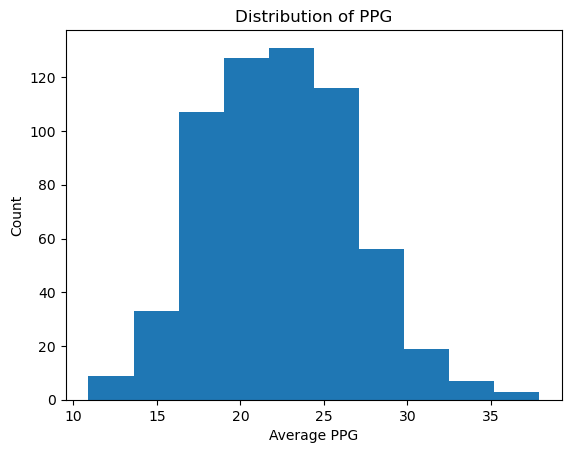

In [1001]:
EDA['PPG'].plot(kind='hist')
plt.title('Distribution of PPG')
plt.xlabel('Average PPG')
plt.ylabel('Count')
# Normal distribution, not clear skew

<Axes: ylabel='PPG'>

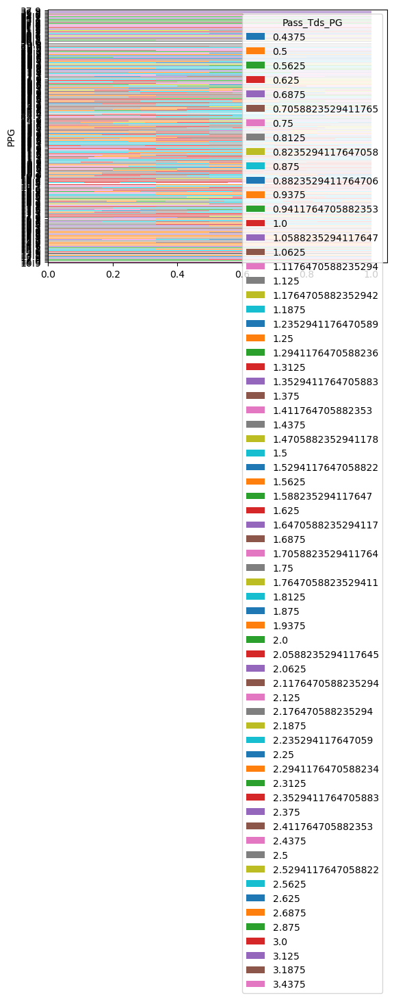

In [918]:
EDA.groupby('PPG')['Pass_Tds_PG'].value_counts(normalize=True).unstack().plot(kind='barh', stacked=True)

In [919]:
corr_mat = EDA.corr()
corr_mat
# Correlation matrix demonstrating how features interact with each other and the target variable

/var/folders/qz/qvyy0rxs3rdfhwskr09cq4q80000gn/T/ipykernel_55246/708128061.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_mat = EDA.corr()


,PPG,Tot_TDs_PG,1st_Downs_PG,Rush_1st_Downs_PG,Pass_1st_Downs_PG,OFF_1st_by_pen_PG,3rd_Conv_Rate,4th_Conv_Rate,Pass_Comp_Rate,Pass_Yds_PG,Pass_Yds_Per_Attempt,Pass_Tds_PG,Off_Int_PG,Rush_Att_PG,Yds_Per_Rush,Rush_Yds_PG,Rush_Tds_PG,Off_Plays_PG,Tot_Yds_PG,Kickoffs_Returned_PG,Avg_K_Return_Yds,Punts_Returned_PG,Avg_P_Return_Yds,Int_Forced_PG,Avg_I_Return_Yds,Yds_Per_Punt,Punts_PG,FG_Conv_Rate,Touchback_Rate,Penalties_PG,Avg_Pen_Yds_PG,Fum_Lost_PG,Games,Year,DEF_PPG_Against,DEF_Tot_Tds_PG_Against,DEF_1st_Downs_PG_Against,DEF_Rush_1st_Downs_PG_Against,DEF_Pass_1st_Downs_PG_Against,DEF_1st_by_pen_PG,DEF_3rd_Conv_Rate,DEF_4th_Conv_Rate,DEF_Pass_Comp_Rate,DEF_Pass_Yds_Per_Attempt,DEF_Pass_Yds_PG,DEF_Pass_Tds_PG,DEF_Int_PG,DEF_Rush_Att_PG,DEF_Yds_Per_Rush,DEF_Rush_Yds_PG,DEF_Rush_Tds_PG,DEF_Tot_Plays_PG,DEF_YPG_Against,DEF_Kickoffs_Returned_PG,DEF_Avg_K_Return_Yds,DEF_Punts_Returned_PG,DEF_Avg_P_Return_Yds,DEF_Avg_I_Return_Yds,DEF_Yds_Per_Punt_Against,DEF_Touchback_Rate,DEF_Avg_Pen_Yds_PG,Sacks_Taken_PG,Sack_Yds_Lost_PG,FG_Att_PG,FG_Good_PG,Pass_Att_PG,DEF_Pass_Att_PG,DEF_Sacks_PG,DEF_Sack_Yds_PG
PPG,1.000000,0.972306,0.783250,0.432319,0.612523,0.212739,0.676861,0.304851,0.568423,0.649649,0.736760,0.801459,-0.409568,0.246655,0.270292,0.314305,0.593662,0.391475,0.809432,0.180918,-0.001822,-0.075382,-0.032804,0.278123,0.060474,0.053558,-0.631299,0.172599,0.154620,-0.069004,0.001406,-0.280011,0.005796,0.128588,-0.109259,-0.129904,0.053344,-0.242206,0.244743,0.085112,-0.062879,-0.110946,-0.075028,-0.111625,0.204888,0.053651,0.278123,-0.561386,0.067320,-0.317563,-0.194049,-0.080916,0.023277,-0.235958,0.067952,-0.534385,0.055656,-0.110388,0.053319,0.127955,0.069163,-0.492311,-0.472355,0.167994,0.217115,0.179100,0.434038,0.293810,0.331155
Tot_TDs_PG,0.972306,1.000000,0.775118,0.421827,0.609663,0.212328,0.674774,0.300635,0.566091,0.643805,0.735554,0.836609,-0.385468,0.212715,0.283978,0.300011,0.599385,0.353556,0.797378,0.171470,-0.006837,-0.104824,-0.017314,0.250616,0.056423,0.032853,-0.600885,0.065383,0.143555,-0.059226,0.011334,-0.261593,0.001475,0.129548,-0.062745,-0.077961,0.089390,-0.208763,0.265863,0.088581,-0.039178,-0.099047,-0.034823,-0.078976,0.226292,0.088562,0.250616,-0.529335,0.086567,-0.286067,-0.163650,-0.058439,0.057774,-0.223988,0.050132,-0.502894,0.019009,-0.085924,0.061513,0.126950,0.075042,-0.476780,-0.450412,-0.030317,0.001758,0.175694,0.427079,0.273517,0.307431
1st_Downs_PG,0.783250,0.775118,1.000000,0.441291,0.823864,0.401522,0.749239,0.293686,0.627418,0.787389,0.656166,0.709488,-0.302928,0.150150,0.217290,0.218567,0.477962,0.681311,0.910825,-0.034443,0.069003,-0.240409,0.030997,-0.028974,-0.058281,0.081322,-0.729155,0.056233,0.300818,-0.101029,-0.004849,-0.184092,0.061353,0.301769,0.110229,0.050068,0.113128,-0.162489,0.252227,0.111798,0.042246,-0.010585,0.085608,0.078099,0.243008,0.198852,-0.028974,-0.523447,0.165858,-0.236523,-0.102171,-0.230167,0.089369,-0.386888,0.008055,-0.595354,-0.053861,-0.110845,0.280226,0.344119,0.111951,-0.394569,-0.377189,0.167848,0.169737,0.464760,0.276676,0.159501,0.202685
Rush_1st_Downs_PG,0.432319,0.421827,0.441291,1.000000,-0.110094,-0.045676,0.395588,0.250364,0.150504,-0.093770,0.267210,0.075103,-0.355198,0.779495,0.651012,0.882203,0.715961,0.254024,0.375876,0.111658,-0.046449,-0.077046,-0.038539,0.076973,-0.052570,-0.003252,-0.421409,0.023971,0.035595,-0.183611,-0.125079,-0.158011,0.155063,0.098917,-0.095657,-0.187679,-0.121136,-0.166536,-0.016660,-0.038167,-0.057077,-0.071902,-0.092047,-0.126008,-0.048974,-0.066216,0.076973,-0.396656,-0.018895,-0.258241,-0.151267,-0.306764,-0.182302,-0.118969,0.033338,-0.379636,0.041737,-0.124468,0.035443,0.021248,-0.181657,-0.240293,-0.288469,0.080961,0.080963,-0.414412,0.083893,0.112244,0.132185
Pass_1st_Downs_PG,0.612523,0.609663,0.823864,-0.110094,1.000000,0.279855,0.615052,0.180733,0.624002,0.944379,0.576853,0.741004,-0.115537,-0.313563,-0.137876,-0.287861,0.102526,0.593575,0.796861,-0.051841,0.104328,-0.208793,0.071534,-0.074363,-0.025806,0.060

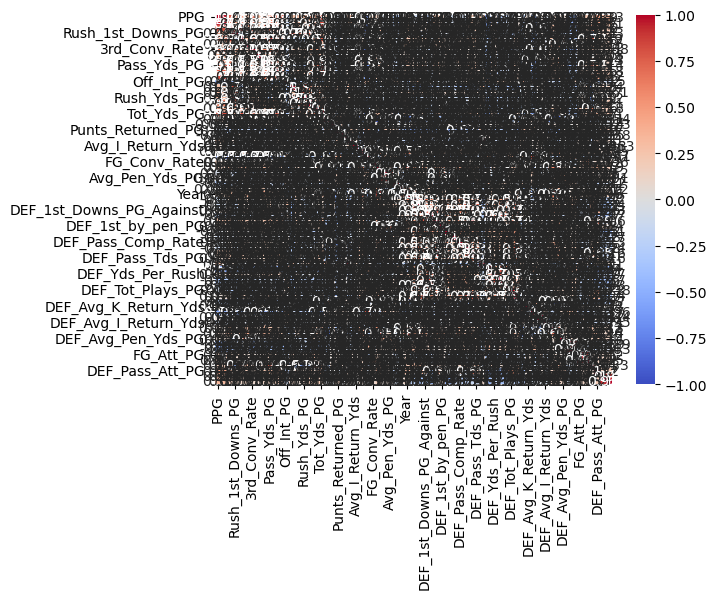

In [920]:
plt.figure()
sns.heatmap(corr_mat, cmap='coolwarm', center=0, vmin = -1, vmax = 1, annot=True)
plt.show()
# lol so this is useless

In [921]:
EDA['PPG'].describe()

count    608.000000
mean      22.369243
std        4.413077
min       10.900000
25%       19.100000
50%       22.400000
75%       25.400000
max       37.900000
Name: PPG, dtype: float64

(0.0, 35.0)

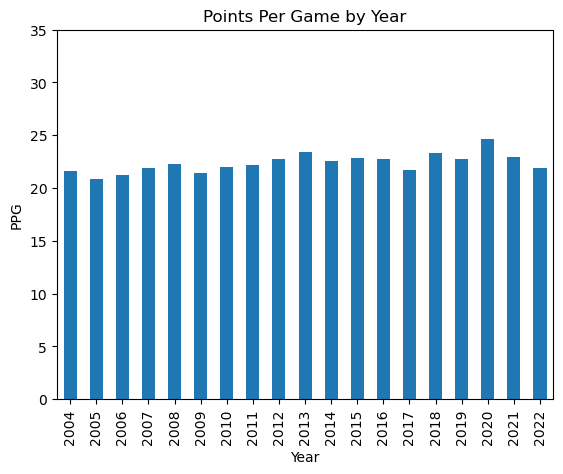

In [922]:
EDA.groupby('Year')['PPG'].mean().plot(kind='bar')
plt.title('Points Per Game by Year')
plt.xlabel('Year')
plt.ylabel('PPG')
plt.ylim(0,35)

Text(0, 0.5, 'Year')

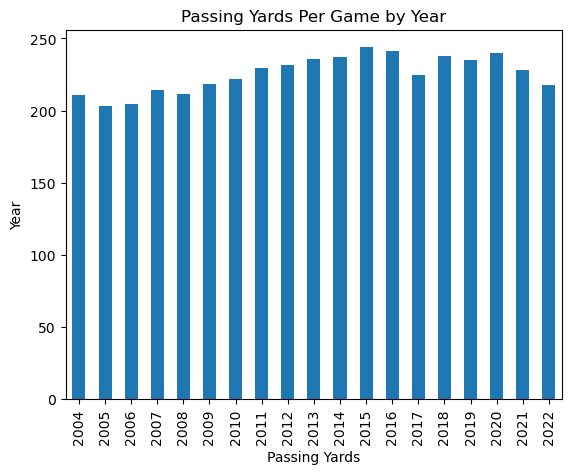

In [923]:
EDA.groupby('Year')['Pass_Yds_PG'].mean().plot(kind='bar')
plt.title('Passing Yards Per Game by Year')
plt.xlabel('Passing Yards')
plt.ylabel('Year')

Text(0, 0.5, 'Rushing Yards Per Game')

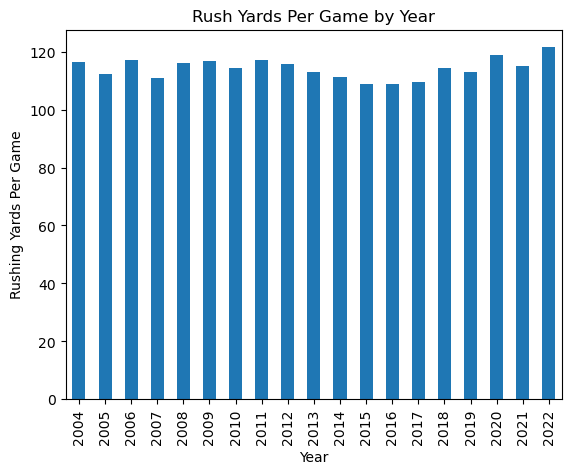

In [924]:
EDA.groupby('Year')['Rush_Yds_PG'].mean().plot(kind='bar')
plt.title('Rush Yards Per Game by Year')
plt.xlabel('Year')
plt.ylabel('Rushing Yards Per Game')

Text(0.5, 1.0, '3rd Down Conversion Rate by Year')

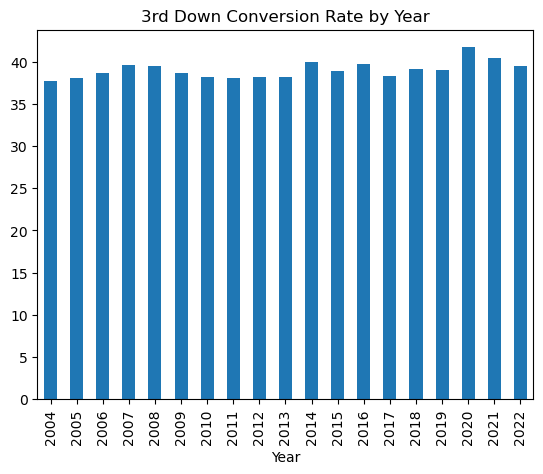

In [925]:
EDA.groupby('Year')['3rd_Conv_Rate'].mean().plot(kind='bar')
plt.title('3rd Down Conversion Rate by Year')

In [926]:
weather.info()

NameError: name 'weather' is not defined

# Base Regression Model

In [ ]:
base = EDA.select_dtypes(['number'])
# For now, we are dropping non-numeric columns by selecting only columns with numbers in them for our logistical regression.

In [ ]:
base.head()
# looks good

In [ ]:
import statsmodels.api as sm

In [ ]:
X = base.drop('PPG', axis=1)
# Drop PPG in the X because we can't use something to predict itself. We only want to know how other features affect it

y = base['PPG']
# Target variable is PPG

In [ ]:
X_withC = sm.add_constant(X)

In [ ]:
X_withC.head()

In [ ]:
# Instantiating the log reg model
b_logreg = sm.Logit(y, X_withC)

# FItting Model
b_logregFit = b_logreg.fit()

# Model summary
b_logregFit.summary()

In [ ]:
# why is this not working?
base.isna().sum()
# nope not this

In [ ]:
# lets try a smaller one for now...

In [ ]:
X = base[['Tot_TDs_PG', '1st_Downs_PG', 'Rush_1st_Downs_PG', 'Pass_1st_Downs_PG', '3rd_Conv_Rate', '4th_Conv_Rate', 'Pass_Comp_Rate', 'Pass_Yds_PG', 'Off_Int_PG', 'Rush_Att_PG', 'Rush_Yds_PG', 'Yds_Per_Rush', 'Rush_Tds_PG', 'Off_Plays_PG']]
y = base['PPG']

In [ ]:
X_withC = sm.add_constant(X)

In [ ]:
X_withC.head()

In [ ]:
# Instantiating the log reg model
b_logreg = sm.Logit(y, X_withC)

# FItting Model
b_logregFit = b_logreg.fit()

# Model summary
b_logregFit.summary()

In [ ]:
b_linreg = sm.OLS(y, X)

In [ ]:
B_linregFit = b_linreg.fit()

In [ ]:
print(B_linregFit.summary())

In [ ]:
X = base.drop('PPG', axis=1)
# Drop PPG in the X because we can't use something to predict itself. We only want to know how other features affect it

y = base['PPG']
# Target variable is PPG

In [ ]:
b1_linreg = sm.OLS(y, X)

In [ ]:
b1_linregFit = b1_linreg.fit()

In [ ]:
print(B_linregFit.summary())

In [ ]:
# Very very high R-squared score
# Way too overfit with too many features

In [ ]:
sns.lmplot(X, y)

## Weather Data
#### How temperature, humitidy, and wind (mph) affects points scored

The problem with the dataset from NFL Savant is it does not show precipitation, which it probably the most important aspect of how weather affects a game. 
1. Run with this for now. If you have more time then worry about it later
2. Meteostat API (this could literally be an entire project in itself so don't do this until everything else is done)

In [ ]:
# https://www.datawithbliss.com/weather-data
# Meteostat API

In [ ]:
weather = pd.read_csv('/Users/justintunley/Documents/BrainStation/Capstone/Data Sets/Weather_1960-2013.csv')

In [ ]:
weather.head()

In [ ]:
weather.info()

In [ ]:
weather.shape

In [ ]:
weather.isna().sum()

In [ ]:
weather['wind_chill'].isna().sum()
# so many nulls so lets not worry about this rn

In [ ]:
weather = weather.drop('wind_chill', axis=1)
# dropping the column

In [ ]:
weather.head()

In [ ]:
weather.isna().sum()
# uh oh

In [ ]:
weather.info()
# humidity and wind_mph should be integers

In [ ]:
# Lets create a new feature column for combine expected score...
# We will need to combine home_score and away_score...
weather['total_points'] = (weather['home_score'] + weather['away_score'])
weather.head()

In [ ]:
# Next steps:
#   1. 

max_wind = weather['wind_mph'].max()
min_wind = weather['wind_mph'].min()
max_temp = weather['temperature'].max()
min_temp = weather['temperature'].min()

print(f'Max wind recorded: {max_wind}')
print(f'Min wind recorded: {min_wind}')
print(f'Max temperature recorded: {max_temp}')
print(f'Min temperature recorded: {min_temp}')

In [ ]:
# lets make cuttoffs for temperature first

# freezing:   -inf --> 14.99°
# cold:        15° --> 39.99°
# chilly:      40° --> 59.99°
# warm:        60° --> 79.99°
# hot:         80° --> inf

temp_range = weather['temperature']

def temp_dum(temp_range):
    for x in temp_range:
        if x < 14.99:
            return freezing
        elif x > 15 & x < 39.99:
            return cold
        elif x > 40 & x < 59.99:
            return chilly
        elif x > 60 & x < 79.99:
            return warm
        else:
            return hot

weather['temp_binned'] = weather['temperature'].append(temp_dum)

In [ ]:
weather['humidity'] = weather['humidity'].str.rstrip('%').astype(float)/100

In [ ]:
max_humid = weather['humidity'].max()
min_humid = weather['humidity'].min()
avg_humid = weather['humidity'].mean()


print(f'Max humidity recorded: {max_humid}')
print(f'Min humidity recorded: {min_humid}')
print(f'Average humidity recorded: {avg_humid}')
# hmmmm... is this actually good information? Isn't 100% humidity 

In [ ]:
weather.head()

In [ ]:
weather['total_points'] = weather['home_score'] + weather['away_score']

In [ ]:
weather.head()

In [ ]:
weather.rename(columns={'weather':'description'}, inplace=True)

In [ ]:
weather.head()

In [ ]:
weather.groupby('temperature')['total_points'].plot(kind='barh')

## Basic Offense Data Sets
#### Upon creation of our data scraper, this dataset should be obsolite

In [ ]:
b_off = pd.read_csv('/Users/justintunley/Documents/BrainStation/Capstone/Data Sets/Basic_Offense.csv')

In [ ]:
b_off.head()

In [ ]:
b_off.info()

In [ ]:
b_off = b_off.replace(',','', regex=True)
# removing commas

In [ ]:
b_off.head()
# sanity check

In [ ]:
b_off['Team'] = b_off['Team'].astype(str)

In [ ]:
b_off.info()

In [ ]:
X = b_off.drop(['PPG', 'Team'], axis=1)
y = b_off['PPG']

In [ ]:
corrb_off = X.corr()
mask = np.triu(corrb_off)

In [ ]:
plt.figure(figsize=(10,10))

sns.heatmap(corrb_off.round(2), annot=True, mask=mask, cmap='coolwarm')

Obviously, we have high correlation between yards and yards/game considering that one is used as a calculation of the other. While this could be inferred, we can see the level by creating a measuring the correlation. Since games played varies between teams, we will be dropping total yards colummns and leaving yards per game columns.

Maybe we can drop games played? If we need to calculate ratios it would be helpful to have, but will not be used to predict anything on our model.

Columns we drop:
"tot_Yds", "pass_Yds", "rush_Yds" 

--------------------------------------------------------------------

In [ ]:
clean_off = b_off.drop(columns=['tot_Yds', 'pass_Yds', 'rush_Yds', 'tot_points'])
clean_off.head()

In [ ]:
X = clean_off.drop(['PPG', 'Team'], axis=1)
y = clean_off['PPG']

In [ ]:
corr_clean_off = X.corr()
mask = np.triu(corr_clean_off)

In [ ]:
plt.figure(figsize=(10,10))

sns.heatmap(corr_clean_off.round(2), annot=True, mask=mask, cmap='coolwarm')

In [ ]:
plt.figure(figsize=(10,10))

sns.heatmap(corrb_off.round(2), annot=True, mask=mask, cmap='coolwarm')

Additional variables to search for:
1. Interceptions per game
2. Fumbles per game
    - while turnovers encompasses both, we should take an extra step to determine if there is a different in win probability depending on the type of turnover. If there is not, we can drop these and look for turnovers.
    - Search Sports Reference Data Set
3. Turnovers per game
--------------------------------------------------------------------
4. Depth of target
5. Formations


In [ ]:
ppg_plot = clean_off.sort_values('PPG', ascending=False)
ppg_plot.head(10)
# lol this is literally how the CSV is ordered

In [ ]:
sns.barplot(ppg_plot, x='Team', y='PPG')
plt.title('Top Scoring Offenses')
plt.xlabel('Team')
plt.ylabel('Points Per Game')
plt.xlim(0,7)

In [ ]:
totYPG_plot = clean_off.sort_values('tot_YPG', ascending=False)
RYPG_plot.head(10)
# Cleveland, Baltimore, Arizona and Chicago out of no where
# Shows that this regression will only work if I can combine with defensive metrics before the first regression
# Shows teams can gain lots of yards but fail to convert them into touchdowns. **NEED TO ADD REDZONE CONVERSION DATA**
# Teams can have great offenses but be held back by their defenses.

# Key takeaway: 3rd down and redzone conversions matter and must be added to improve model accuracy

In [ ]:
passYPG_plot = clean_off.sort_values('pass_YPG', ascending=False)
passYPG_plot.head(10)

In [ ]:
runYPG_plot = clean_off.sort_values('rush_YPG', ascending=False)
runYPG_plot.head(10)

In [ ]:
sns.barplot(runYPG_plot, x='Team', y='rush_YPG')
plt.title('Top 8 Team in Rushing Yards Per Game')
plt.xlabel('Team')
plt.ylabel('Rushing Yards Per Game')
plt.xlim(0,7)

## Basic Defense Data Sets
#### Upon creation of our data scraper, this dataset should be obsolite

In [ ]:
defense = pd.read_csv('/Users/justintunley/Documents/BrainStation/Capstone/Data Sets/Big_Team_Defense.csv')

In [ ]:
defense.head()

In [ ]:
defense.info()

In [ ]:
defense.isnull().sum()

In [ ]:
defense = defense.dropna()

In [ ]:
defense.isnull().sum()

In [ ]:
X = defense.drop(['points_against', 'index', 'Team', 'Sc%', 'games_played', 'TO%'], axis=1)
y = defense['points_against']

In [ ]:
corr_defense = X.corr()
mask = np.triu(corr_defense)

In [ ]:
plt.figure(figsize=(15,15))

sns.heatmap(corr_defense.round(2), annot=True, mask=mask, cmap='coolwarm')

# NFELO Team Rankings and Stats (2023)

In [ ]:
nfelo = pd.read_csv('/Users/justintunley/Documents/BrainStation/Capstone/Data Sets/Nfelo-Power-Rankings-2023.csv')

In [ ]:
nfelo.head()

In [ ]:
nfelo.info()

In [ ]:
nfelo.isnull().sum()

# NFL Teams and Stadiums

In [ ]:
teams2 = pd.read_csv('/Users/justintunley/Documents/BrainStation/Capstone/Data Sets/nfl_teams.csv')

In [ ]:
teams2
# If scraping is not an option, this will be the key for team_ids and divisions

In [ ]:
teams2.info()

In [ ]:
teams2.duplicated().sum()

In [ ]:
teams2.isna().sum()
# Dont really need to clean 

In [ ]:
# COLUMNS TO DROP: teams_conference_pre2002, team_division_pre2002, 

# ROWS TO DROP: ALL 

In [ ]:
stadiums2 = pd.read_csv('/Users/justintunley/Documents/BrainStation/Capstone/Data Sets/nfl_stadiums.csv', encoding='unicode_escape')
# Encoding='unicode_escape' necessary to read

In [ ]:
stadiums2.head()

In [ ]:
stadiums2.head()

In [ ]:
pbp22 = pd.read_csv('/Users/justintunley/Documents/BrainStation/Capstone/Data Sets/Out of Scope/pbp-2022.csv')
pbp23 = pd.read_csv('/Users/justintunley/Documents/BrainStation/Capstone/Data Sets/Out of Scope/pbp-2023.csv')

In [ ]:
pbp22.head()
# Very ugly datasets. Makes more sense to scrape from ESPN

In [ ]:
pbp23.head()